# Assessment for Advanced Data Science

## Christian Cabrera, Carl Henrik Ek and Neil D. Lawrence

### 29th October 2021



Welcome to the course assessment for the Advanced Data Science unit. In this assessment you will build a prediction system for UK house prices. 

Your prediction system will be based on data from the UK Price Paid data available [here](https://www.gov.uk/government/statistical-data-sets/price-paid-data-downloads). By combining this data with the UK Office for National Statistics data on the latitude/longitude of postcodes (available [here](https://www.getthedata.com/open-postcode-geo)) you will have a record of house prices and their approximate latitude/longitude. Due to the size of these data you will use a relational database to handle them.  

To make predictions of the house price you will augment your data with information obtained from Open Street Map: an open license source of mapping information. You will use the techniques you have learnt in the course to indentify and incorporate useful features for house price prediction.



Alongside your implementation you will provide a short repository overview describing how you have implemented the different parts of the project and where you have placed those parts in your code repository. You will submit your code alongside a version of this notebook that will allow your examiner to understand and reconstruct the thinking behind your analysis. This notebook is structured to help you in creating that description and allow you to understand how we will allocate the marks. You should make use of the Fynesse framework (<https://github.com/lawrennd/fynesse_template>) for structuring your code. 

Remember the notebook you create should *tell a story*, any code that is not critical to that story can safely be placed into the associated analysis library and imported for use (structured as given in the Fynesse template)

The maximum total mark for this assessment is 20. That mark is split into Three Questions below, each worth 5 marks each. Then a final 5 marks will be given for the quality, structure and reusability of the code and analysis you produce giving 20 marks in total.


### Useful Links

You may find some of the following links useful when building your system.

University instuctions on Security and Privacy with AWS.

https://help.uis.cam.ac.uk/service/network-services/hosting-services/AWS/aws-security-privacy

Security Rules in AWS 

https://docs.aws.amazon.com/AmazonRDS/latest/UserGuide/USER_VPC.Scenarios.html#USER_VPC.Scenario4

### Installing Your Library

One artefact to be included in your submission is a python library structured according to the "Access, Assess, Address" standard for data science solutions. You will submit this library alongside your code. Use the cell below to perform the necessary installation instructions for your library.

You should base your module on the template repository given by the Fynesse template repository. That should make it `pip` installable as below. 



In [1]:
# Install your library here, for example the fynesse template 
# is set up to be pip installable
%pip install git+https://github.com/kimxworrall/adsassessment.git

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/kimxworrall/adsassessment.git to /tmp/pip-req-build-0tcihv21
  Running command git clone -q https://github.com/kimxworrall/adsassessment.git /tmp/pip-req-build-0tcihv21
     |████████████████████████████████| 43 kB 992 kB/s 
     |████████████████████████████████| 1.6 MB 9.5 MB/s 
     |████████████████████████████████| 121 kB 50.1 MB/s 
     |████████████████████████████████| 83 kB 964 kB/s 
  Created wheel for fynesse: filename=fynesse-0.1.0-py3-none-any.whl size=17999 sha256=dc5232bfc450172496c2702183cb36849b15f92aae555265e25e1a666a1a9c86
  Stored in directory: /tmp/pip-ephem-wheel-cache-1fpduqcw/wheels/4b/f3/be/6b7fc90cf9fab718db9657507918620a03df35aeb9fc2dd413
Successfully built fynesse


Your own library should be installed in the line above, then you can import it as usual (where you can either replace `fynesse` with the name you've given your analysis module or you can leave the name as `fynesse` as you prefer).

In [2]:
import numpy as np
np.seterr(all="ignore")
%pip install proplot

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 8.0 MB 4.7 MB/s 


In [3]:
%pip install geopandas

%pip install pygeos
%pip install osmnx
%pip install matplotlib==3.1.3
%pip install geojson_rewind
%pip install mlai
%pip install geopy
%pip install global_land_mask
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')
import osmnx as ox
import matplotlib.pyplot as plt
import math

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.0 MB 5.1 MB/s 
     |████████████████████████████████| 6.3 MB 44.8 MB/s 
     |████████████████████████████████| 16.7 MB 44.6 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 2.1 MB 4.3 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 95 kB 2.8 MB/s 
     |████████████████████████████████| 62 kB 1.5 MB/s 
     |████████████████████████████████| 1.0 MB 39.1 MB/s 
     |████████████████████████████████| 11.2 MB 50.1 MB/s 
     |████████████████████████████████| 965 kB 63.0 MB/s 
  Attempting uninstall: requests
    Found existing installation: requests 2.23.0
    Uninstalling requests-2.23.0:
      Successfully uninstalled requests-2.23.0
  Attempting uninstall

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 13.1 MB 4.4 MB/s 
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.5.3
    Uninstalling matplotlib-3.5.3:
      Successfully uninstalled matplotlib-3.5.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
osmnx 1.1.2 requires matplotlib>=3.4, but you have matplotlib 3.1.3 which is incompatible.


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 42 kB 1.3 MB/s 
     |████████████████████████████████| 64 kB 2.3 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.8 MB 5.4 MB/s 


PLEASE NOTE:
This needs to be run twice, the first time throws an error because the package proplot requires a metadata file that it does not load the first time.

In [7]:
import fynesse

## Question 1. Accessing a Database of House Prices, Latitudes and Longitudes

The UK price paid data for housing in dates back to 1995 and contains millions of transactions. The size of the data makes it unwieldy to manipulate directly in python frameworks such as `pandas`. As a result we will host the data in a *relational database*. 

Using the following ideas.

1. A cloud hosted database (such as MariaDB hosted on the AWS RDS service).
2. The SQL language wrapped in appropriately structured python code.
3. Joining of two databases.

You will construct a database containing tables that contain all house prices, latitudes and longitudes from the UK house price data base since 1995.

You will likely find the following resources helpful.

1. Lecture 1, 2 and 3.
2. Lab class 1 and 2.
3. The UK Price Paid data for houses: <https://www.gov.uk/government/statistical-data-sets/price-paid-data-downloads>
4. The UK ONS Data base of postcode latitude and longitudes:  <https://www.getthedata.com/open-postcode-geo>

Below we provide codeboxes and hints to help you develop your answer.

*The main knowledge you need to do a first pass through this question will have been taught by the end of Lab Session 2 (11th November 2021). You will likely want to review your answer as part of **refactoring** your code  and analysis pipeline shortly before hand in.*

*5 Marks*

### Task A

Set up the database. You'll need to set up a database on AWS. You were guided in how to do this in the lab sessions. You should be able to use the same database instance you created in the lab, or you can delete that and start with a fresh instance. You'll remember from the lab that the database requires credentials (username, password) to access. It's good practice to store those credentials *outside* the notebook so you don't accidentally share them by e.g. checking code into a repository. 
  
Call the database you use for this assessment `property_prices`.
  

### Connection

In [4]:
# Write code for requesting and storing credentials (username, password) here. 
import yaml
from ipywidgets import interact_manual, Text, Password

In [5]:
@interact_manual(username=Text(description="Username:"), 
                 password=Password(description="Password:"))
def write_credentials(username, password):
    with open("credentials.yaml", "w") as file:
        credentials_dict = {'username': username, 
                            'password': password}
        yaml.dump(credentials_dict, file)

interactive(children=(Text(value='', description='Username:'), Password(description='Password:'), Button(descr…

In [ ]:
baby_database = "database-1.cgrre17yxw11.eu-west-2.rds.amazonaws.com"

In [8]:
big_database = "database-ksw39.cgrre17yxw11.eu-west-2.rds.amazonaws.com"

In [9]:
conn = fynesse.access.create_database_connection(big_database)

In [ ]:
'''This is an operation to close the database connection, useful if you stop a cell mid-call, then 
you should close the connection and reconnect.'''
conn.close()

### Database Creation

> This section does an initial call to create the database, the database will be called 'uk_ppd'

TODO: I know its not meant to be, but oops.



In [ ]:
# Write any other setup code you need for setting up database access here.
fynesse.access.create_ukppd_database(conn)

### Task B

Create a database table called `pp_data` containing all the UK Price Paid data from the [gov.uk site](https://www.gov.uk/government/statistical-data-sets/price-paid-data-downloads). You'll need to prepare a new table to receive the data and upload the UK Price Paid data to your database instance. The total data is over 3 gigabytes in size. We suggest that rather than downloading the full data in CSV format, you use the fact that they have split the data into years and into different parts per year. For example, the first part of the data for 2018 is stored at <http://prod.publicdata.landregistry.gov.uk.s3-website-eu-west-1.amazonaws.com/pp-2018-part1.csv>. Each of these files is less than 100MB and can be downloaded very quickly to local disk, then uploaded using 


```
LOCAL DATA LOAD INFILE 'filename' INTO TABLE `table_name`
FIELDS TERMINATED BY ',' 
LINES STARTING BY '' TERMINATED BY '\n';
```
*Note* this command should be wrapped and placed in an appropriately structured python module. 

Each 'data part' should be downloadable from the `gov.uk` site and uploadable to your database instance in a couple of seconds. By looping across the years and different parts, you should be able to robustly upload this large data set to your database instance in a matter of minutes. 

You may find the following schema useful in creation of your database:

```
--
-- Table structure for table `pp_data`
--
DROP TABLE IF EXISTS `pp_data`;
CREATE TABLE IF NOT EXISTS `pp_data` (
  `transaction_unique_identifier` tinytext COLLATE utf8_bin NOT NULL,
  `price` int(10) unsigned NOT NULL,
  `date_of_transfer` date NOT NULL,
  `postcode` varchar(8) COLLATE utf8_bin NOT NULL,
  `property_type` varchar(1) COLLATE utf8_bin NOT NULL,
  `new_build_flag` varchar(1) COLLATE utf8_bin NOT NULL,
  `tenure_type` varchar(1) COLLATE utf8_bin NOT NULL,
  `primary_addressable_object_name` tinytext COLLATE utf8_bin NOT NULL,
  `secondary_addressable_object_name` tinytext COLLATE utf8_bin NOT NULL,
  `street` tinytext COLLATE utf8_bin NOT NULL,
  `locality` tinytext COLLATE utf8_bin NOT NULL,
  `town_city` tinytext COLLATE utf8_bin NOT NULL,
  `district` tinytext COLLATE utf8_bin NOT NULL,
  `county` tinytext COLLATE utf8_bin NOT NULL,
  `ppd_category_type` varchar(2) COLLATE utf8_bin NOT NULL,
  `record_status` varchar(2) COLLATE utf8_bin NOT NULL,
  `db_id` bigint(20) unsigned NOT NULL
) DEFAULT CHARSET=utf8 COLLATE=utf8_bin AUTO_INCREMENT=1 ;
```
This schema is written by Dale Potter and can be found on Github here: <https://github.com/dalepotter/uk_property_price_data/blob/master/create_db.sql>

You may also find it helpful to set up the following indexes in the database

```
--
-- Indexes for table `pp_data`
--
ALTER TABLE `pp_data`
ADD PRIMARY KEY (`db_id`);
MODIFY `db_id` bigint(20) unsigned NOT NULL AUTO_INCREMENT,AUTO_INCREMENT=1;
CREATE INDEX `pp.postcode` USING HASH
  ON `pp_data`
    (postcode);
CREATE INDEX `pp.date` USING HASH
  ON `pp_data` 
    (date_of_transfer);
```


In the box below, briefly describe what the schema is doing and why we will find it useful to create the indexes we have for the table we've created.

```GIVE YOUR WRITTEN ANSWER HERE```
It is always important to inspect our data first and to find out what our different variables are.


---
* `transaction_unique_identifier` - This is a unique reference number for each published sale, which is automatically generated each time a sale is recorded.
* `price` - This is the integer price in pounds that the property was sold for.
*  `date_of_transfer` - This is the data which the transfer deed states the sale was completed, though records are often not listed until a significant period of time later, perhaps even a year.
*  `postcode` -  The postcode on which the property was at the time of the sale. (Postcodes are sometimes updated or removed over time, but as we use this only to estimate the property location, this will not make too much difference. Note that postcodes can be reallocated and these changes are not reflected in the Price Paid Dataset.)
* `property_type` - This can be F = flat, apartment, or maisonette, 	D = Detached, S = Semi-Detached (shares one wall with one other house), T = Terraced (this includes end of terraced properties which share only one wall), O = Other
Note that:
- we only record the above categories to describe property type, we do not separately identify bungalows
- end-of-terrace properties are included in the Terraced category above
- ‘Other’ is only valid where the transaction relates to a property type that is not covered by existing values, for example where a property comprises more than one large parcel of land
Other can also include runs of multiple houses sold as one, for example city centre flats which are sold as a block say number 3-5 on a street (especially those which are converted into shops below and houses above). Thus there is a lot of variation in the prices of these.
*  `new_build_flag`  	Indicates the age of the property and applies to all price paid transactions, residential and non-residential.
Y = a newly built property, N = an established residential building.
A new build property is defined as a newly built property but not a conversion of existing residential property,
e.g. a residential house converted into
flats. A property will only be ‘Y’ New when it is first registered. Any subsequent changes of
ownership the category will be changed to ‘N’ Old.

*  `tenure_type` Relates to the tenure: F = Freehold, L= Leasehold etc.
Note that HM Land Registry does not record leases of 7 years or less in the Price Paid Dataset.
Freehold means that the owner owns the land they purchase the property one, and leasehold is when a the purchaser does not own the land, but purchases the property for a period of time. They do not have complete rights over what maintenance they do to the property, as that is up to the discretion of the freeholder of the land they have leased the property on. Most flats are leaseheld, but now commonhold leases are also being introduced to allow residents of an apartment block collective ownership of the land their property resides on.
*  `primary_addressable_object_name` Typically the house number or name. (Or name of the building/court which the property is a part of)
*  `secondary_addressable_object_name` Where a property has been divided into separate units (for example, flats), the PAON (above) will identify the building and a SAON will be specified that identifies the separate unit/flat.
*  `street` The name of the street that the property was on at time of sale.
*  `locality` ,  `town_city` ,  `district` , `county` These are all parts of the address that the property was listed at, smallest bound to largest. Not all properties are in a locality.
*  `ppd_category_type` Indicates the type of Price Paid transaction.
A = Standard Price Paid entry, includes single residential property sold for value.
B = Additional Price Paid entry including transfers under a power of sale/repossessions, buy-to-lets (where they can be identified by a Mortgage), transfers to non-private individuals and sales where the property type is classed as ‘Other’.

Note that category B does not separately identify the transaction types stated.
HM Land Registry has been collecting information on Category A transactions from January 1995. Category B transactions were identified from October 2013.
*  `record_status` - found in the monthly file only.	Indicates additions, changes and deletions to the records.(see guide below).
A = Addition
C = Change
D = Delete

Note that where a transaction changes category type due to misallocation (as above) it will be deleted from the original category type and added to the correct category with a new transaction unique identifier.
*  `db_id` - This is the unique identifier in the table so that the records can be indexed.


---

Sources:
Explanation from the Land Registry site that hosts the data, https://www.gov.uk/guidance/about-the-price-paid-data
Additional explanation from the Kent county council:
https://www.kent.gov.uk/__data/assets/pdf_file/0008/138527/house-price-annual-bulletin-2021.pdf

**Indexing** 
We index on the postcode and the date of transfer, this helps speed up our SQL queries, as it helps us match postcodes to postcode data, and select transactions between a specified date range.

Data preparation:
We receive the paid price data in a non-standardised format, as the csvs are csvs of strings only in the first three years, and later encapsulate names in "", we use 'OPTIONALLY ENCLOSED' in our SQL query so as to remove the quote marks.

In [ ]:
from fynesse.access import create_ppd_table,create_postcode_data_table
#create the table
create_ppd_table(conn)
#Upload data to the table between the years denoted, uploads the part1 and part2 files for each year, printing their names as it cycles.
fynesse.access.load_price_paid_data_to_year(1995,2022,conn)

Paid price data table created with table name `pp_data`


In [ ]:
#Test to check data appears in the table as expected
fynesse.database_functions.head(conn,"pp_data")

('{E53EDD2D-AB5C-83EC-E053-6B04A8C03A59}', 160000, datetime.date(2022, 4, 14), 'WN5 9LQ', 'T', 'N', 'L', '549', '', 'ORMSKIRK ROAD', '', 'WIGAN', 'WIGAN', 'GREATER MANCHESTER', 'A', 'A', 1)
('{E53EDD2D-AB5D-83EC-E053-6B04A8C03A59}', 245000, datetime.date(2022, 6, 10), 'OL10 3HG', 'D', 'N', 'L', '2', '', 'CLEMSHAW CLOSE', '', 'HEYWOOD', 'ROCHDALE', 'GREATER MANCHESTER', 'A', 'A', 2)
('{E53EDD2D-AB5E-83EC-E053-6B04A8C03A59}', 165500, datetime.date(2022, 1, 31), 'OL15 8JZ', 'T', 'N', 'L', '77', '', 'FEATHERSTALL ROAD', '', 'LITTLEBOROUGH', 'ROCHDALE', 'GREATER MANCHESTER', 'A', 'A', 3)
('{E53EDD2D-AB5F-83EC-E053-6B04A8C03A59}', 131500, datetime.date(2022, 6, 30), 'OL6 9JD', 'T', 'N', 'L', '145', '', 'HOLDEN STREET', '', 'ASHTON-UNDER-LYNE', 'TAMESIDE', 'GREATER MANCHESTER', 'A', 'A', 4)
('{E53EDD2D-AB60-83EC-E053-6B04A8C03A59}', 228500, datetime.date(2022, 6, 10), 'BL5 3DP', 'D', 'N', 'L', '37', '', 'WHARFEDALE', 'WESTHOUGHTON', 'BOLTON', 'BOLTON', 'GREATER MANCHESTER', 'A', 'A', 5)
('{E5

In [ ]:
'''This is an option to load the data to the table from the file containing all of the data, but takes significantly longer'''
#fynesse.access.load_files_to_table("pp_complete.csv",conn,"pp_data")

### Task C

Create a database table called `postcode_data` containing the ONS Postcode information. <GetTheData.com> has organised data derived from the UK Office for National Statistics into a convenient CSV file. You can find details [here](https://www.getthedata.com/open-postcode-geo).


The data you need can be found at this url: <https://www.getthedata.com/downloads/open_postcode_geo.csv.zip>. It will need to be unzipped before use.

You may find the following schema useful for the postcode data (developed by Christian and Neil)

```
USE `property_prices`;
--
-- Table structure for table `postcode_data`
--
DROP TABLE IF EXISTS `postcode_data`;
CREATE TABLE IF NOT EXISTS `postcode_data` (
  `postcode` varchar(8) COLLATE utf8_bin NOT NULL,
  `status` enum('live','terminated') NOT NULL,
  `usertype` enum('small', 'large') NOT NULL,
  `easting` int unsigned,
  `northing` int unsigned,
  `positional_quality_indicator` int NOT NULL,
  `country` enum('England', 'Wales', 'Scotland', 'Northern Ireland', 'Channel Islands', 'Isle of Man') NOT NULL,
  `lattitude` decimal(11,8) NOT NULL,
  `longitude` decimal(10,8) NOT NULL,
  `postcode_no_space` tinytext COLLATE utf8_bin NOT NULL,
  `postcode_fixed_width_seven` varchar(7) COLLATE utf8_bin NOT NULL,
  `postcode_fixed_width_eight` varchar(8) COLLATE utf8_bin NOT NULL,
  `postcode_area` varchar(2) COLLATE utf8_bin NOT NULL,
  `postcode_district` varchar(4) COLLATE utf8_bin NOT NULL,
  `postcode_sector` varchar(6) COLLATE utf8_bin NOT NULL,
  `outcode` varchar(4) COLLATE utf8_bin NOT NULL,
  `incode` varchar(3)  COLLATE utf8_bin NOT NULL,
  `db_id` bigint(20) unsigned NOT NULL
) DEFAULT CHARSET=utf8 COLLATE=utf8_bin;
```

And again you'll want to set up indices for your table.

```
ALTER TABLE `postcode_data`
ADD PRIMARY KEY (`db_id`);
MODIFY `db_id` bigint(20) unsigned NOT NULL AUTO_INCREMENT,AUTO_INCREMENT=1;
CREATE INDEX `po.postcode` USING HASH
  ON `postcode_data`
    (postcode);
```

And you can load the CSV file into the table in one "INFILE".

```
LOAD DATA LOCAL INFILE 'open_postcode_geo.csv' INTO TABLE `postcode_data`
FIELDS TERMINATED BY ',' 
LINES STARTING BY '' TERMINATED BY '\n';
```

**Description**

In this table, we are interested in the postcode, and the longitude and latitude associated with the approximate center of the postcode. Some postcodes are quite wide, and can have buildings indexed by the postcode that are several miles apart.
Postcodes can also be updated. Postcodes are listed as small or large, small postcodes get less than 100 items of post a day, large postcodes get more. Large postcodes are typically smaller geographically than small postcodes.

In [ ]:
from fynesse.access import create_postcode_data_table
#Create the table
create_postcode_data_table(conn)

postcode data table created with table name `postcode_data`


In [ ]:
#Download the data from the zipfile, and then upload it to the database
fynesse.access.load_postcode_data(conn)

In [ ]:
fynesse.database_functions.head(conn, "postcode_data")

('AB1 0AA', 'terminated', 'small', 385386, 801193, 1, 'Scotland', Decimal('57.10147400'), Decimal('-2.24285100'), 'AB10AA', 'AB1 0AA', 'AB1  0AA', 'AB', 'AB1', 'AB1 0', 'AB1', '0AA', 1)
('AB1 0AB', 'terminated', 'small', 385177, 801314, 1, 'Scotland', Decimal('57.10255400'), Decimal('-2.24630800'), 'AB10AB', 'AB1 0AB', 'AB1  0AB', 'AB', 'AB1', 'AB1 0', 'AB1', '0AB', 2)
('AB1 0AD', 'terminated', 'small', 385053, 801092, 1, 'Scotland', Decimal('57.10055600'), Decimal('-2.24834200'), 'AB10AD', 'AB1 0AD', 'AB1  0AD', 'AB', 'AB1', 'AB1 0', 'AB1', '0AD', 3)
('AB1 0AE', 'terminated', 'small', 384600, 799300, 8, 'Scotland', Decimal('57.08444400'), Decimal('-2.25570800'), 'AB10AE', 'AB1 0AE', 'AB1  0AE', 'AB', 'AB1', 'AB1 0', 'AB1', '0AE', 4)
('AB1 0AF', 'terminated', 'large', 384460, 800660, 8, 'Scotland', Decimal('57.09665600'), Decimal('-2.25810200'), 'AB10AF', 'AB1 0AF', 'AB1  0AF', 'AB', 'AB1', 'AB1 0', 'AB1', '0AF', 5)
('AB1 0AG', 'terminated', 'large', 383890, 800710, 8, 'Scotland', Deci

### Task D 

These data can now be joined to form a new table that contains house price paid and latitude longitude of the house. We could create a new table that contains all this information. However, the computation of that table will take some time because of the size of the two existing tables in the join. 

Instead, we're going to exploit the nature of the task. To build our prediction model, we're going to use the prices for a particular region in a given time period. This means we can select that region and time period and build the joined data only from the relevent rows from the two tables. This will save time on the join.

Whether this is a good idea or not in a live system will depend on how often these predictions are required. If it's very often, it would likely be better to store the entired database joined, because the one-off cost for that join is amortised across all the future predictions. If only a few predictions are required (like in our lab class) then doing that join on the fly might be better. In that case you can make use of an  *inner join* for this data set creation.

```
USE `property_prices`;
--
-- Table structure for table `prices_coordinates_data`
--
DROP TABLE IF EXISTS `prices_coordinates_data`;
CREATE TABLE IF NOT EXISTS `prices_coordinates_data` (
  `price` int(10) unsigned NOT NULL,
  `date_of_transfer` date NOT NULL,
  `postcode` varchar(8) COLLATE utf8_bin NOT NULL,
  `property_type` varchar(1) COLLATE utf8_bin NOT NULL,
  `new_build_flag` varchar(1) COLLATE utf8_bin NOT NULL,
  `tenure_type` varchar(1) COLLATE utf8_bin NOT NULL,
  `locality` tinytext COLLATE utf8_bin NOT NULL,
  `town_city` tinytext COLLATE utf8_bin NOT NULL,
  `district` tinytext COLLATE utf8_bin NOT NULL,
  `county` tinytext COLLATE utf8_bin NOT NULL,
  `country` enum('England', 'Wales', 'Scotland', 'Northern Ireland', 'Channel Islands', 'Isle of Man') NOT NULL,
  `lattitude` decimal(11,8) NOT NULL,
  `longitude` decimal(10,8) NOT NULL,
  `db_id` bigint(20) unsigned NOT NULL
) DEFAULT CHARSET=utf8 COLLATE=utf8_bin AUTO_INCREMENT=1 ;


```



In [ ]:
#Create the table
fynesse.access.create_prices_coordinates_data_table(conn)

In [ ]:
'''
This can be used to join the full tables together
'''
#fynesse.access.join_ppd_pcd(conn)

### For the purposes of analytics, we join all of the 2022 data only, and use that for question 2.

In [ ]:
fynesse.access.join_ppd_pcd_indaterange(conn,('2022-01-01','2022-12-31'))

In [ ]:
def join_ppd_pcd_select(conn):
    """
    Find postcode data for each sale, join results
    """

    cur = conn.cursor()
    cur.execute("""
                SELECT ft.price, ft.date_of_transfer, ct.postcode, ft.property_type, ft.new_build_flag, ft.tenure_type, ft.primary_addressable_object_name, ft.street, ft.locality, ft.town_city, ft.district, ft.county, ct.country, ct.lattitude, ct.longitude, ft.db_id
                FROM
                    (SELECT `postcode`,`db_id`,`price`, `date_of_transfer`, `property_type`,`new_build_flag`, `tenure_type`,`primary_addressable_object_name`, `street`, `locality`, `town_city`, `district`, `county`   FROM pp_data) ft
                INNER JOIN 
                    (SELECT `postcode`, `lattitude`, `longitude`, `country` FROM postcode_data ) ct
                ON
                    ft.`postcode` = ct.`postcode`
                LIMIT 5;
                """)
    rows = cur.fetchall()
    return rows

In [ ]:
join_ppd_pcd_select(conn)

(160000, datetime.date(2022, 4, 14), 'WN5 9LQ', 'T', 'N', 'L', '549', 'ORMSKIRK ROAD', '', 'WIGAN', 'WIGAN', 'GREATER MANCHESTER', 'England', Decimal('53.53582300'), Decimal('-2.67262700'), 1)
(245000, datetime.date(2022, 6, 10), 'OL10 3HG', 'D', 'N', 'L', '2', 'CLEMSHAW CLOSE', '', 'HEYWOOD', 'ROCHDALE', 'GREATER MANCHESTER', 'England', Decimal('53.58764600'), Decimal('-2.22669200'), 2)
(165500, datetime.date(2022, 1, 31), 'OL15 8JZ', 'T', 'N', 'L', '77', 'FEATHERSTALL ROAD', '', 'LITTLEBOROUGH', 'ROCHDALE', 'GREATER MANCHESTER', 'England', Decimal('53.64185800'), Decimal('-2.10646100'), 3)
(131500, datetime.date(2022, 6, 30), 'OL6 9JD', 'T', 'N', 'L', '145', 'HOLDEN STREET', '', 'ASHTON-UNDER-LYNE', 'TAMESIDE', 'GREATER MANCHESTER', 'England', Decimal('53.49320800'), Decimal('-2.08860400'), 4)
(228500, datetime.date(2022, 6, 10), 'BL5 3DP', 'D', 'N', 'L', '37', 'WHARFEDALE', 'WESTHOUGHTON', 'BOLTON', 'BOLTON', 'GREATER MANCHESTER', 'England', Decimal('53.55486400'), Decimal('-2.51648

In [ ]:
fynesse.database_functions.head(conn, "prices_coordinates_data")

(325000, datetime.date(2022, 1, 1), 'TN21 0HQ', 'S', 'N', 'F', '30', 'PAYNSBRIDGE WAY', 'HORAM', 'HEATHFIELD', 'WEALDEN', 'EAST SUSSEX', 'England', Decimal('50.93457300'), Decimal('0.24709300'), 27660907)
(160000, datetime.date(2022, 1, 1), 'M40 3PA', 'S', 'N', 'F', '51', 'BROADWAY', '', 'MANCHESTER', 'MANCHESTER', 'GREATER MANCHESTER', 'England', Decimal('53.51972200'), Decimal('-2.16640800'), 27696905)
(325000, datetime.date(2022, 1, 1), 'LD7 1HY', 'D', 'N', 'F', 'MIN-Y-DDOL', 'PRESTEIGNE ROAD', '', 'KNIGHTON', 'POWYS', 'POWYS', 'Wales', Decimal('52.33903300'), Decimal('-3.04385900'), 27734051)
(160000, datetime.date(2022, 1, 1), 'DT2 8HA', 'T', 'N', 'F', '18', 'WATERGATES LANE', 'BROADMAYNE', 'DORCHESTER', 'DORSET', 'DORSET', 'England', Decimal('50.68289800'), Decimal('-2.37752000'), 27734837)
(299950, datetime.date(2022, 1, 1), 'PO20 2GA', 'T', 'N', 'L', '20', 'SAXON MEADOW', 'TANGMERE', 'CHICHESTER', 'CHICHESTER', 'WEST SUSSEX', 'England', Decimal('50.84722500'), Decimal('-0.72140

## Question 2. Accessing OpenStreetMap and Assessing the Available Features

In question 3 you will be given the task of constructing a prediction system for property price levels at a given location. We expect that knowledge of the local region around the property should be helpful in making those price predictions. To evaluate this we will now look at [OpenStreetMap](https://www.openstreetmap.org) as a data source.

The tasks below will guide you in accessing and assessing the OpenStreetMap data. The code you write will eventually be assimilated in your python module, but documentation of what you've included and why should remain in the notebook below. 

Accessing OpenStreetMap through its API can be done using the python library `osmx`. Using what you have learned about the `osmx` interface in the lectures, write general code for downloading points of interest and other relevant information that you believe may be useful for predicting house prices. Remembering the perspectives we've taken on *data science as debugging*, the remarks we've made when discussing *the data crisis* of the importance of reusability in data analysis, and the techniques we've explored in the labsessions for visualising features and exploring their correlation use the notebook to document your assessment of the OpenStreetMap data as a potential source of data.

The knowledge you need to do a first pass through this question will have been taught by end of lab session three (16th November 2021). You will likely want to review your answer as part of *refactoring* your code and analysis pipeline shortly before hand in.

You should write reusable code that allows you to explore the characteristics of different points of interest. Looking ahead to question 3 you'll want to incorporate these points of interest in your prediction code.

*5 marks*


In [ ]:
# Use this cell and cells below for summarising your analysis and documenting your decision making.


### Notes on reading this section

This question specifically asks about relations to osmnx data, but in order to understand the osmnx data and its relation to the price paid data, we must first assess the price paid data before we can look at correlations.

###Price Paid Data Assessment

####Inspect

The first action is to inspect the data files, and the sources they came from, to see where there are missing values, errors, understand what data is recorded, and to get an understanding of what each different part of the data means.

The initial part of this action was to go through any documentation provided by the organisation which provides the data, to see what each type of data means, what it includes and excludes, and what the ranges of values are.

https://www.gov.uk/guidance/about-the-price-paid-data The documentation about how to use the paid price data was instrumental, as well as significant amounts of time looking through the individual csv files, entering locations into maps and also looking at alternate sources, such as property listing sites like rightmove and zoopla. This helped provide a holistic and intuitive understanding of the data, and also to see it in context of the people who live in the areas, the geographical and historical context for different trends, and give a sense of the bounds of data.

#### Initial assessment of paid price data
The first action was to briefly look through the files that hold house price data, and normalise the uploads by adding the 'OPTIONALLY ENCLOSED BY `""`' line.
This was necessary as the csv files from 1995-1998 are saved as csvs of strings marked by "", and strings in later files are also enclosed by the double quotation marks.

The column that indicates a flat or apartment name can contain nulls, but this will be accounted for.

Some transactions will be missing from this data set as only properties registered with the HM Land registry that are sold for value are listed.

Some properties that have been in the same ownership since before 1990 and have not been mortgaged since will not be available. 
Further only sales for value are listed, some properties are inherited, given, or exchanged, and thus these transactions are not included.

This excludes two types of residential property, that owned by nobility or large landowners over many generations (for example royal homes, or old farms), and new builds that have not yet been sold. 
These would be the most difficult to value from the set of data, old properties can often be worth a large amount of money, and this would not be calculable necessarily by location, as historical value, property size on the land, and even wealth of the owner can all be crucial factors. Further they are not necessarily near any other similar properties.
New builds would also be difficult, as if the size of the total development is not known (only a location, and property type), and the quality of the work not yet known, then only a rough estimate can be given. A better source for this would be to look at the predicted price from the developer, and a comparison with recently sold similar new builds.

#### Looking for anomalies, and general trends
Now if we look solely at the 2022 data, we can check for anomalies in the prices, and look at the trends in the data.
When looking at the Cumalitive Distribution Functions of house prices from 2022, we saw these graphs:

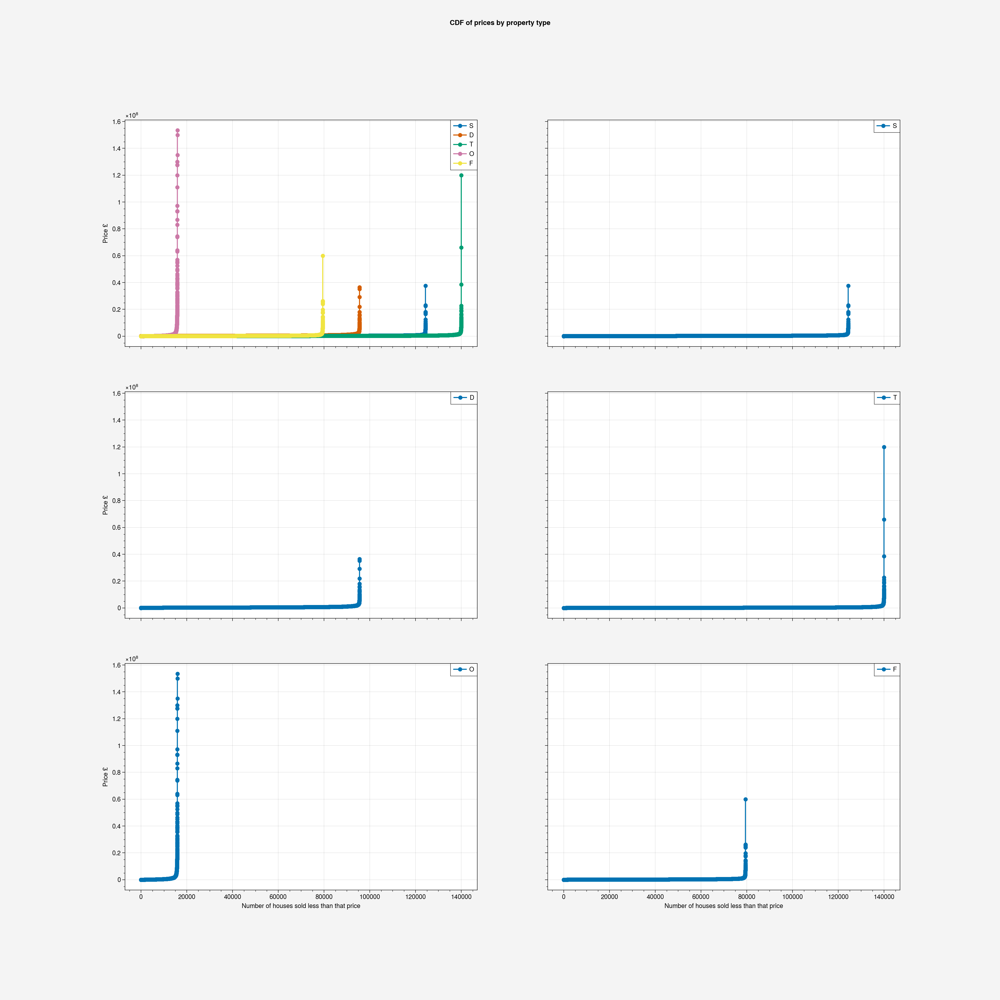

<Figure size 4000x2000 with 0 Axes>

In [10]:
from fynesse.data_visualisation import plot_cdfs_by_propertytype
plot_cdfs_by_propertytype(conn)

There are a few interesting things that are immediately of note.


1.   The largest number of properties sold were terraced houses.
2.   There is a very large variance between the cheapest properties and the most expensive properties, for all types of property.
3. However, the majority of properties are clustered to a more similar price, with a smaller percentage being so expensive, that the rest look fairly similar in price.
4. For the flats, the semi-detached houses, and in particular the terraced houses, there are a few properties that are very significantly more expensive that any other, and therefore warrant checking to see if it is reasonable that they are listed as such.



The most expensive terraced house is listed as selling at £120 million, which intuitively is extremely expensive, particularly as that makes it the most expensive listing over even detached houses, and on inspection of the record that has this price we can find the house location.

If we assume terraced house prices are generally of order of magnitude around £100,000 - 500,000 , the add two zeros error would signify houses with prices of more than £50,000,000.
Looking at these gave:

In [ ]:
def select_properties_typet_prices_overx(conn,x,t):
  cur = conn.cursor()
  cur.execute(f"SELECT * FROM prices_coordinates_data WHERE property_type = '{t}' and price > {x};")
  rows = cur.fetchall()
  return rows

rows = select_properties_typet_prices_overx(conn,30000000,'T')
for r in rows:
  print(r)

(38500000, datetime.date(2022, 1, 20), 'W2 2LH', 'T', 'N', 'F', '1', 'HYDE PARK PLACE', '', 'LONDON', 'CITY OF WESTMINSTER', 'GREATER LONDON', 'England', Decimal('51.51315200'), Decimal('-0.16339300'), 27800907)
(120000000, datetime.date(2022, 4, 8), 'KT7 0DL', 'T', 'N', 'F', '2', 'ROYAL THAMES WALK', '', 'THAMES DITTON', 'ELMBRIDGE', 'SURREY', 'England', Decimal('51.38320000'), Decimal('-0.33314900'), 28056107)
(66000000, datetime.date(2022, 8, 15), 'SS9 2AT', 'T', 'N', 'F', '29', 'GLENDALE GARDENS', '', 'LEIGH-ON-SEA', 'SOUTHEND-ON-SEA', 'SOUTHEND-ON-SEA', 'England', Decimal('51.54482300'), Decimal('0.65221300'), 27975646)


Inspection of this house online, and a listing for another of the houses in its block of newbuild houses reveals that the real price sold for was actually £1.2 million. 
(https://search.savills.com/property-detail/gbesrsehs220078 here is a listing for one of the neighbouring houses)
The error that we can infer happened here is that the price is written with an extra two zeros in the dataset retrieved from the HM Land Registry (to represent pennies) but there is no decimal point.

Doing the same to the next most expensive house also reveals the same error.

Neither of these are surprising, the corrected prices are similar to the the averages found for listed prices in their postcodes on both rightmove and zoopla (listings of houses for sale by current estate agents).

Interestingly, the third most expensive terraced house sold, being in Westminster in London, is listed correctly.
Here is an article about the property:
https://www.thesun.co.uk/news/14635002/property-sale-millions-sale-hyde-park-london-georgian/

We should check both the most expensive and the cheapest properties.
The cheapest terraced house was £12,000. (This on inspection turned out to be likely incorrect and actually that the property was sold for £120,000, we can infer that a 0 was missed when the price was entered). This is based on the listing of the house's sold data on two seperate property websites, which use data from estate agents.
The second cheapest house also likely falls under this error, examining other houses in this area also produce an average of 10 times more expensive than this property, so it is unlikely this is the actual price.
(see here on rightmove sold properties, uses the same dataset as us https://www.rightmove.co.uk/house-prices/b14/brooklands-drive.html?country=england&searchLocation=Brooklands+Drive, interestingly they also ommit this sale from their list of properties, likely because they also clean their data)


In [ ]:
def select_properties_typet_prices_underx(conn,x,t):
  cur = conn.cursor()
  cur.execute(f"SELECT * FROM prices_coordinates_data WHERE property_type = '{t}' and price < {x};")
  rows = cur.fetchall()
  return rows

rows = select_properties_typet_prices_underx(conn,17000,'T')
for r in rows:
  print(r)

(16500, datetime.date(2022, 4, 12), 'BB1 4ND', 'T', 'N', 'L', '23', 'HERMITAGE STREET', 'RISHTON', 'BLACKBURN', 'HYNDBURN', 'LANCASHIRE', 'England', Decimal('53.76926500'), Decimal('-2.40836300'), 28047796)
(12000, datetime.date(2022, 6, 9), 'B38 9QB', 'T', 'N', 'F', '19', 'WIGLAND WAY', '', 'BIRMINGHAM', 'BIRMINGHAM', 'WEST MIDLANDS', 'England', Decimal('52.40029700'), Decimal('-1.92710000'), 27761246)
(16250, datetime.date(2022, 7, 22), 'B14 6EJ', 'T', 'N', 'F', '5', 'BROOKLANDS DRIVE', '', 'BIRMINGHAM', 'BIRMINGHAM', 'WEST MIDLANDS', 'England', Decimal('52.41975500'), Decimal('-1.89557200'), 27808082)


It is also sensible to check prices of houses over a few million, as these are unlikely, and to do so out of London, where we can assume that homes are likely to be more expensive. Doing so produces this list:

In [ ]:
def select_properties_typet_prices_overx_outsidelondon(conn,x,t):
  cur = conn.cursor()
  cur.execute(f"SELECT * FROM prices_coordinates_data WHERE property_type = '{t}' and price > {x} and town_city != 'LONDON' and county != 'GREATER LONDON';")
  rows = cur.fetchall()
  return rows

rows = select_properties_typet_prices_overx_outsidelondon(conn,3000000,'T')
for r in rows:
  print(r)

(3285000, datetime.date(2022, 1, 31), 'BA21 4EF', 'T', 'N', 'F', '84', 'CROFTON PARK', '', 'YEOVIL', 'SOUTH SOMERSET', 'SOMERSET', 'England', Decimal('50.94548500'), Decimal('-2.63077800'), 27740778)
(3285000, datetime.date(2022, 1, 31), 'BA21 4LD', 'T', 'N', 'F', '38', "ST MICHAEL'S AVENUE", '', 'YEOVIL', 'SOUTH SOMERSET', 'SOMERSET', 'England', Decimal('50.94668700'), Decimal('-2.61987700'), 27740779)
(3285000, datetime.date(2022, 1, 31), 'BA21 4AR', 'T', 'N', 'F', '67', 'HIGHER KINGSTON', '', 'YEOVIL', 'SOUTH SOMERSET', 'SOMERSET', 'England', Decimal('50.94496700'), Decimal('-2.63330500'), 27741510)
(3285000, datetime.date(2022, 1, 31), 'BA21 4DH', 'T', 'N', 'F', '46', 'GOLDCROFT', '', 'YEOVIL', 'SOUTH SOMERSET', 'SOMERSET', 'England', Decimal('50.94572800'), Decimal('-2.62891700'), 27741525)
(3285000, datetime.date(2022, 1, 31), 'BA21 4DE', 'T', 'N', 'F', '106', 'GOLDCROFT', '', 'YEOVIL', 'SOUTH SOMERSET', 'SOMERSET', 'England', Decimal('50.94680100'), Decimal('-2.63004100'), 27741

We again see the two erroneous listings from before, but also another different type of error, that is stranger and harder to guess a reason for.

There are two cases where multiple properties in a similar location are all listed as sold on the same day, all for the same large sum of money each.
In the first, all are listed under BA2_ ___, for 3285000 on the 31st of January. It is unlikely that this sale actually happened, as that is a very specific number, and also inspection of each individual postcode shows prices in the range of 200,000 - 500,000. 

The second occasion is the 9th of June, where three houses on Histon Road in Cambridge are listed as selling for 8075000, very interesting considering that the house prices on that road are around 400,000. (This was the flag that stuck out, having seen advertisements for these homes in the local cambridge estate agents windows).

This all lends the argument for removing prices of properties from our training data where the prices fall more than two standard deviations from the mean.


### Looking at trends


#### Prices by locality
Having mentioned that prices are expected to be higher in London than elsewhere in the country, the next step is to analyse prices across different districts in the country to see how true this is.
We choose districts to do this because that allows for more granularity within London and Greater London to show variance within the capital.

In [ ]:
'''This function plots a set of pairs of districts and values on a map'''
#plot_district_withdata(prices)

The below function can be used to plot different features and filter the values of those features, these value are plotted on an interactive map, where selecting a column and an item to filter on changes what values the map shows.

This is the function definition:


```
plot_counties_features_groupby(year, groupby,features= ['AVG(price) as average_price', 'COUNT(db_id) as num_sold', 'MAX(price) as Maxprice', 'MIN(price) as Minprice', 'MAX(price) - MIN(price) as pricerange'], conn=conn)
```

This is very reusable as the parameters can simply be changed to look at different aspects in different districts in the country.

In [66]:
from fynesse.data_visualisation import plot_counties_features_groupby
plot_counties_features_groupby(2022,"property_type",conn)
plot_counties_features_groupby(2022,"new_build_flag",conn)

interactive(children=(Select(description='column', options=('average_price', 'num_sold', 'Maxprice', 'Minprice…

interactive(children=(Select(description='column', options=('average_price', 'num_sold', 'Maxprice', 'Minprice…

The graphs above allow you to look at different features grouped by a type for different districts in the UK. It extracts data from the prices_coordinates_data table The base features for these two graphs are : `['AVG(price) as average_price', 'COUNT(db_id) as num_sold', 'MAX(price) as Maxprice', 'MIN(price) as Minprice', 'MAX(price) - MIN(price) as pricerange']`, and the first graph groups by property type, the second by newbuild flag.

You can change the features plotted by this graph by changing the feature parameter with features = list of features to select from database.



We can extract a few interesting features from these graphs, first we can see that for types of property that are not 'Other', the most expensive averages and minimums are heavily clustered in London, and a few hot spots nearby: Oxfordshire and the Cotswolds, and in the greenbelt around London like Kent, Buckinghamshire, Sevenoaks.

This is unsurprising, historically these are places where lots of nobility and wealth are gathered, and are known today as strong commuter belts into London. 

This is not true for properties of Other type, where there are also expensive properties in more rural areas, this is also not surprsing, these properties are likely multiple parcels of land, such as farms being sold along with the land, and in large farming areas. Land in these areas is typically found in large parcels, and therefore it is expected that these would cost a lot.
Another occurence is in cities, from inspection of these sales, it appears these are often sales of multiple concurrent terraced houses as one (which are now used as blocks of flats), and thus explains the cost.

We can also see that the range of prices even within each area is quite large, and this gives reason to use smaller bounding areas when considering facts about house prices, or houses and areas.

In [75]:
from fynesse.database_functions import get_lat_long_from_postcode
import pandas as pd
def get_postcodes(conn):
  rows = pd.read_sql("SELECT postcode FROM prices_coordinates_data;", con = conn)
  return rows

def get_variance_around_point(conn,latitude,longitude,radius):
  cur = conn.cursor()
  cur.execute(f"SELECT MAX(price)-MIN(price) FROM prices_coordinates_data WHERE lattitude < {radius+float(latitude)} AND lattitude > {-radius+float(latitude)} AND longitude < {radius+float(longitude)} AND longitude > {-radius+float(longitude)};")
  rows = cur.fetchall()
  return rows

def get_variance_around_postcodes(radius,conn):
  postcodes = ['SM3 9SB', 'EX14 9AY', 'NR3 1YE', 'DN16 1AA']
  ranges = []
  for p in postcodes:
    loc = get_lat_long_from_postcode(p,conn)
    range = get_variance_around_point(conn,loc[0],loc[1],radius)
    ranges.append([p,range])
  return ranges
def print_price_ranges(conn, radius):
  #fix,ax = pplt.subplots(figsize=plot.big_figsize)
  ranges = get_variance_around_postcodes(radius,conn)
  print( "for a radius of "+str(radius*100000)+"m:")
  print(str(ranges))

print_price_ranges(conn, 0.02)
print_price_ranges(conn, 0.01)
print_price_ranges(conn, 0.0025)
print_price_ranges(conn, 0.0015)

for a radius of 2000.0m:
[['SM3 9SB', ((1798500,),)], ['EX14 9AY', ((735000,),)], ['NR3 1YE', ((7302500,),)], ['DN16 1AA', ((765000,),)]]
for a radius of 1000.0m:
[['SM3 9SB', ((1156000,),)], ['EX14 9AY', ((None,),)], ['NR3 1YE', ((7302500,),)], ['DN16 1AA', ((753000,),)]]
for a radius of 250.0m:
[['SM3 9SB', ((540000,),)], ['EX14 9AY', ((None,),)], ['NR3 1YE', ((320000,),)], ['DN16 1AA', ((0,),)]]
for a radius of 150.0m:
[['SM3 9SB', ((371000,),)], ['EX14 9AY', ((None,),)], ['NR3 1YE', ((30000,),)], ['DN16 1AA', ((None,),)]]


We can see that the smaller the radius around a point, the smaller the range of property prices.

Indeed if we look at individual towns to get an idea of variance of prices within them, we see graphs that look like this:
(These are a few graphs of miscellaneously selected areas)


4


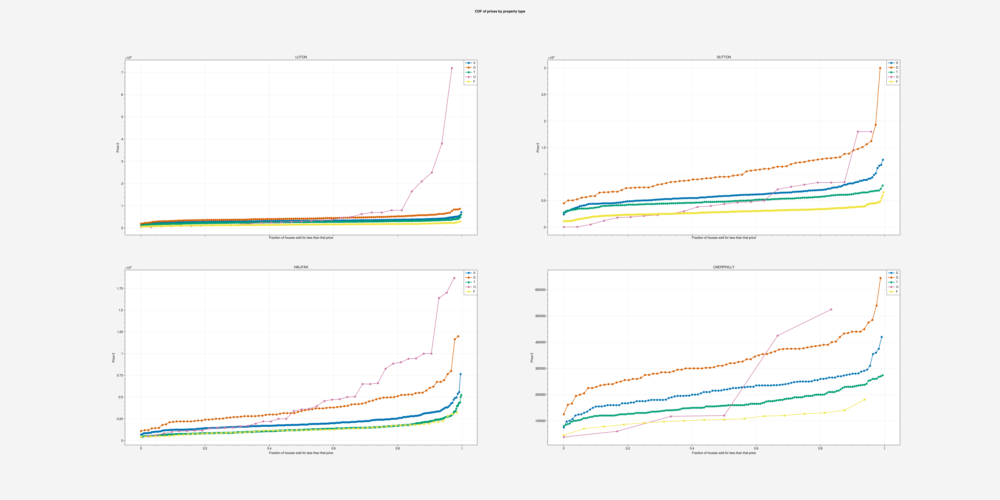

In [ ]:
import numpy as np
from fynesse.data_visualisation import plot_cdfs_by_propertytype_locations

plot_cdfs_by_propertytype_locations("town_city",["LUTON","SUTTON","HALIFAX", "CAERPHILLY"],conn)

#If your graphs look squashed, please click on them and it will adjust to fit your screen


The difference between the most expensive houses and the least expensive houses by town/city is much smaller. Prices are also well clustered by property type, but we still see small spikes towards the most expensive properties. 

This is likely because small regions of each place have the most expensive homes, thus why it is always just a small percentage of the properties sold.

To investigate further, we now go to OSMNX data.

### Working with OSMNX

#### Inspection
We again start by looking at the source, and finding out what we can about the data, where it comes from, and what it contains.

OSMNX is a library for interacting with Open Street Map data, which is an open source wiki database built by amateur cartographers. It has maps for a lot of the world, but is limited in that it is crowd-sourced.

This means it is not necessarily up to date, and that there are some areas that are inconsistent or incorrect.

There is no way for the cartographers to be notified if there has been a change to a local area and to update it, and also, as uploads are not necessarily checked, different contributers may tag points of interest differently.

It is also limited in that it does not contain historical records, so we can only use it to look at what the land looks like in the latest updates.

On the whole, the data is good, as it has lots of contributers, the maps of roads are relatively up to date, and the local areas had to 80% matches across the UK in 2008, and as it is constantly updated, is better now). (Source: https://www.researchgate.net/publication/46559698_How_good_is_OpenStreetMap_information_A_comparative_study_of_OpenStreetMap_and_Ordnance_Survey_datasets_for_London_and_the_rest_of_England)

We can also look interactively at the map online to get an initial intuition: https://www.openstreetmap.org/#map=13/52.3645/-0.2209 

Further we can look at the dictionary of tags and keys in the data to help us find what tags and keys will match points of interest relative to us. https://taginfo.openstreetmap.org.uk/

Looking through the tags a few ideas jump out.

The tag building has top values: {yes, house, residential, semidetached_house, garage, detached, terrace, apartments, industrial, retail}
https://taginfo.openstreetmap.org.uk/keys/building#values

Amenity is a tag that indicates useful things to humans like: {parking, pubs/restaurants, schools, toilets, pharmacies/hospitals/clinics}

We can access some of these through other tags, pharmacies/hospitals/doctors etc. are posted under healthcare too. 


Before addressing the question, it is of interest to look at a few maps, below are a few maps of different locations with the all OSM tags plotted on them:

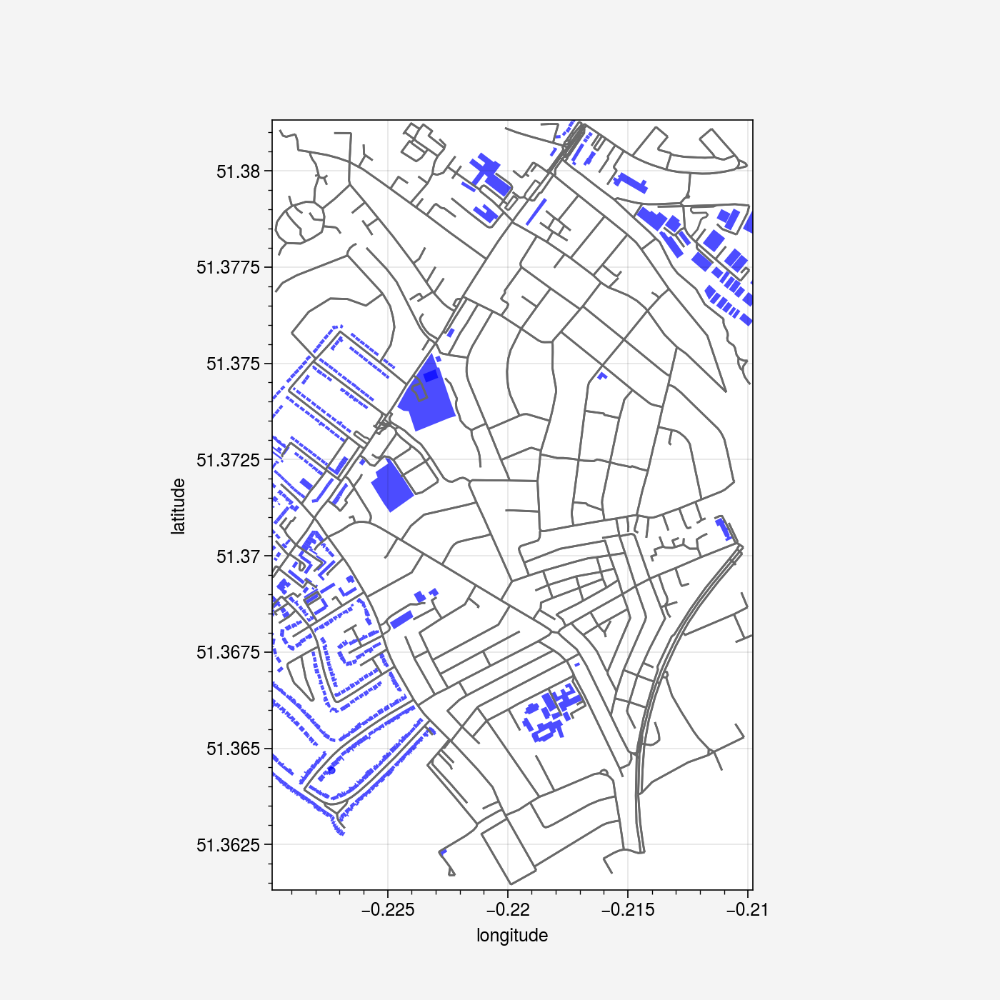

In [11]:
from fynesse.database_functions import get_lat_long_from_postcode
from fynesse.data_visualisation import plot_pois_around_point
import osmnx as ox
l = get_lat_long_from_postcode("SM3 9SB",conn)
plot_pois_around_point(l[0],l[1],0.01,{"building":True})

The above plots a map of all things tagged with building in approximately a kilometer radius in a suburb in South London. All of the roads are residential roads, and should have houses and shops plotted along them.

They are empty here, as this is an area not yet fully covered by any cartographers. 

Whilst being a well populated place, it is not well known for tourism, or for walking, so that may explain why cartographers have not finished plotting everything for this area yet.

This lack of complete data is something to keep in mind.

It is also a good idea to plot property sales and their locations on the map, below is the function which plots in the prices_coordinates_data table by the type of property, and colours them by how much they cost.

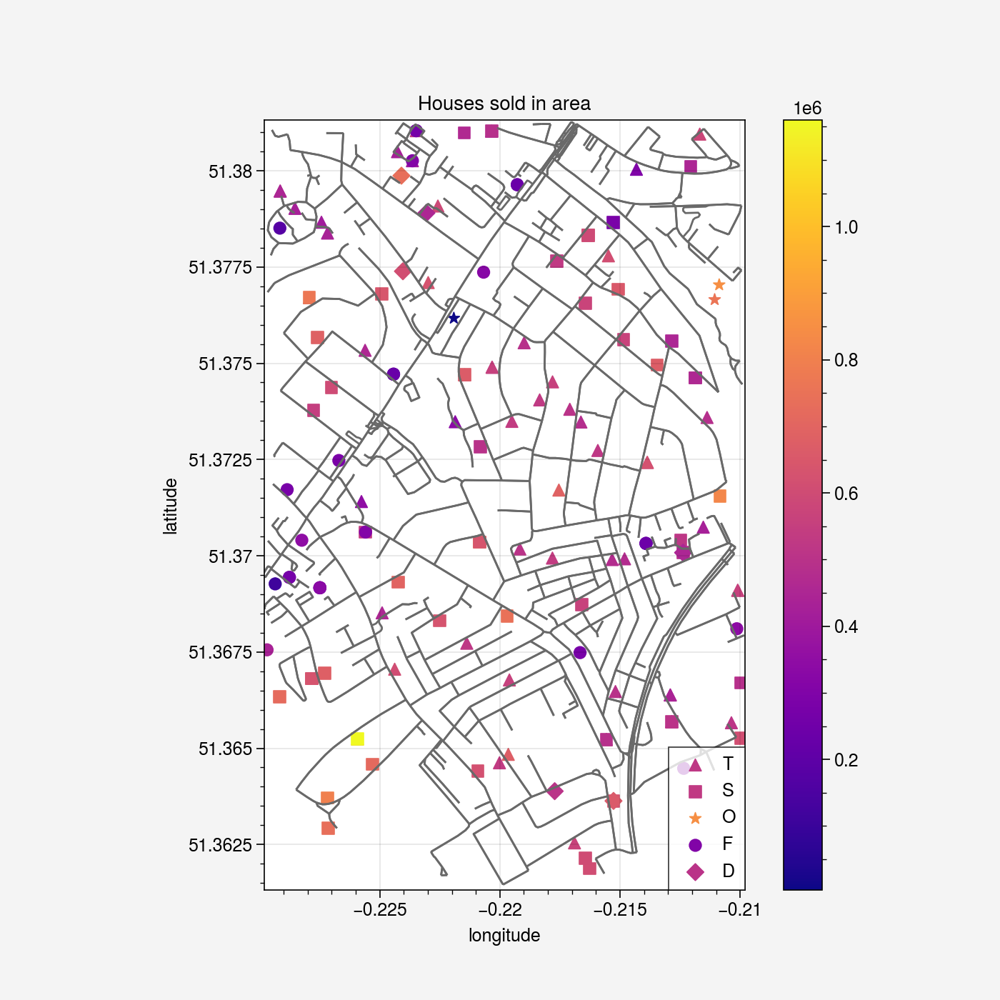

<Figure size 900x900 with 0 Axes>

In [10]:
from matplotlib import axis
import pandas as pd
import proplot as pplt
import matplotlib 
import matplotlib.pyplot as plt
import mlai
from mlai import plot
import geopandas as gpd
from fynesse.database_functions import select_houses_in_radius_around_postcode
from fynesse.data_visualisation import plot_around_postcode
#select_houses_in_radius_around_postcode("SM3 9SB",0.01,conn)





plot_around_postcode("SM3 9SB", 0.01, conn)

This can also be done on the same map as points of interest:

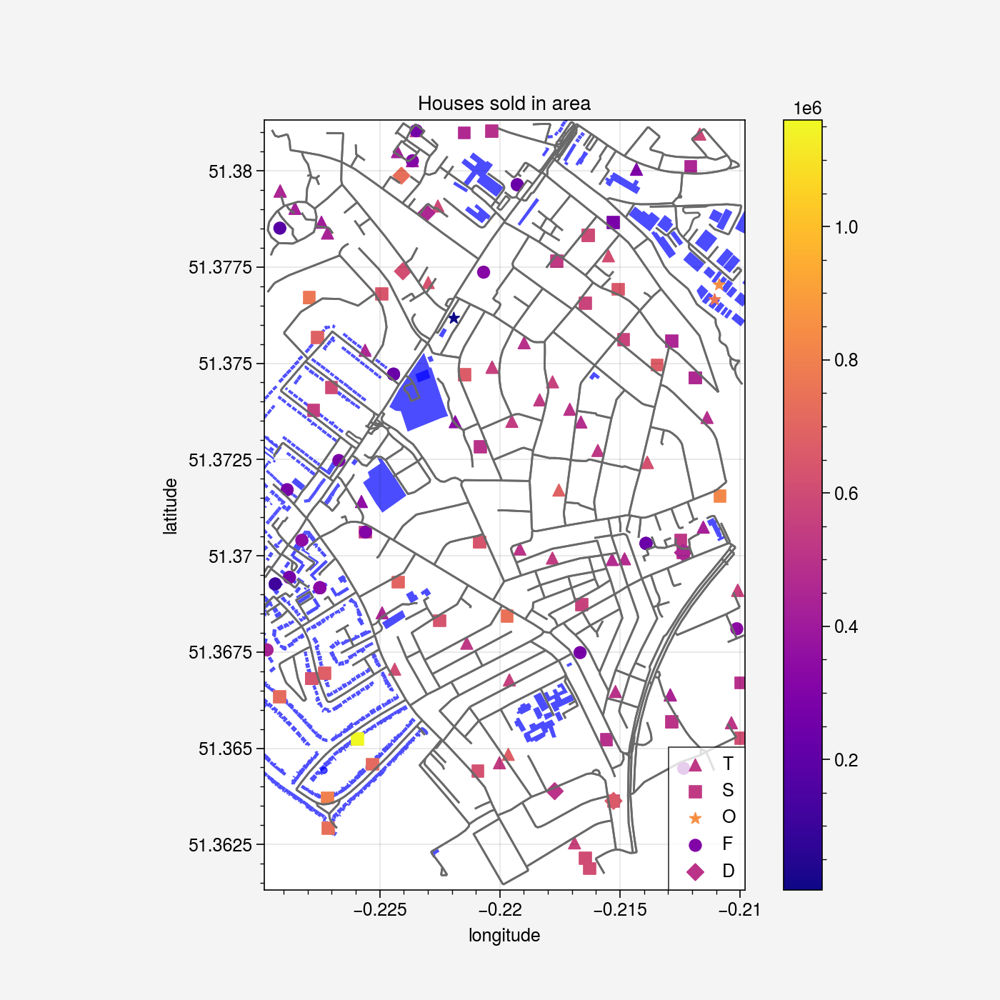

<Figure size 900x900 with 0 Axes>

In [11]:
#select_houses_in_radius_around_postcode("SM3 9SB",0.01,conn)
from fynesse.data_visualisation import *
from fynesse.data_visualisation import plot_around_postcode
plot_pois_houses_around_postcode("SM3 9SB",0.01,conn,{"building":True})#,pplt.subplots(figsize=plot.big_figsize))

#### Exploring the relationship between property prices and OSM features

Let us start with proximity to shops:

/usr/local/lib/python3.7/dist-packages/proplot/internals/process.py:84: DeprecationWarning: `np.str` is a deprecated alias for the builtin `str`. To silence this warning, use `str` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.str_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  np.issubdtype(array.dtype, np.str)
/usr/local/lib/python3.7/dist-packages/proplot/internals/process.py:85: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  or np.issubdtype(array.dtype, np.object)
/usr/local/lib/python3.7/dist-packages/proplot/internals/process.py:84: DeprecationWarning: `np.str` is a 

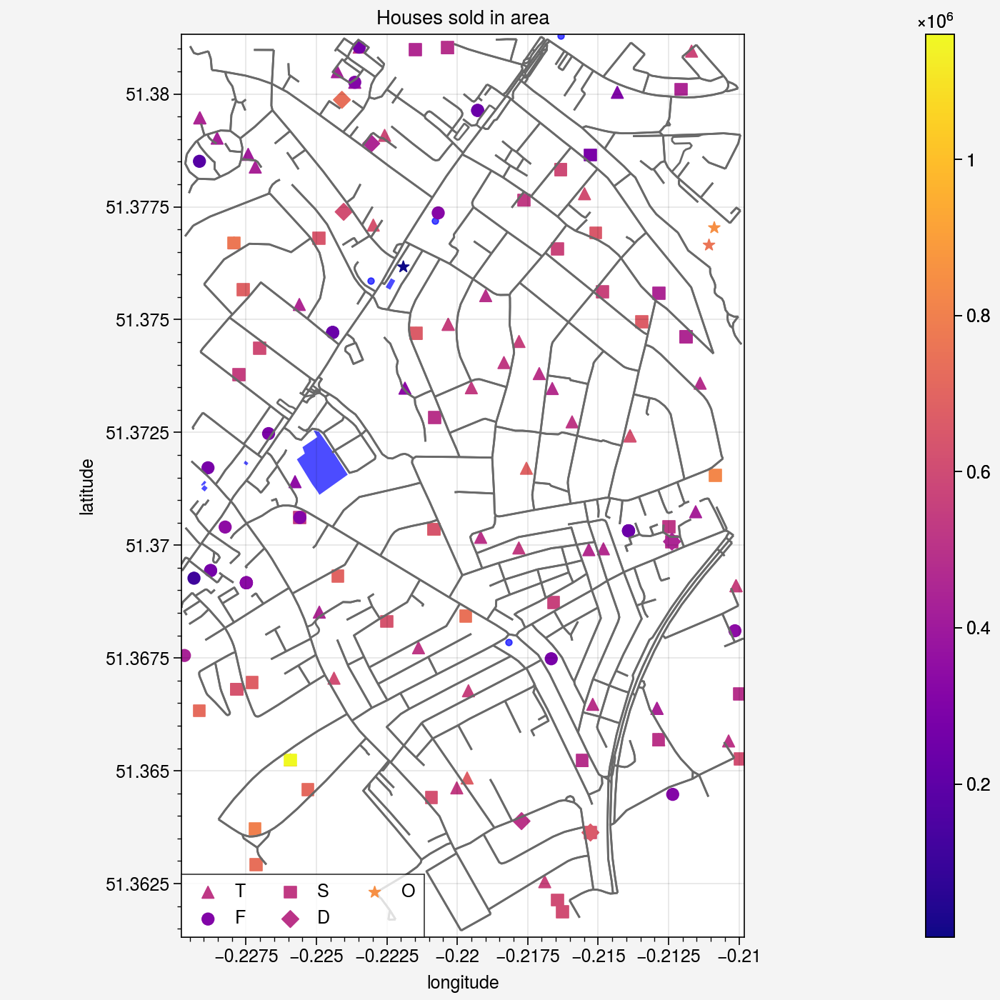

<Figure size 900x900 with 0 Axes>

/usr/local/lib/python3.7/dist-packages/fynesse/data_visualisation.py:272: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  latitudes = [x for x in pois.geometry.centroid.y]
/usr/local/lib/python3.7/dist-packages/fynesse/data_visualisation.py:274: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  longitudes = [x for x in pois.geometry.centroid.x]


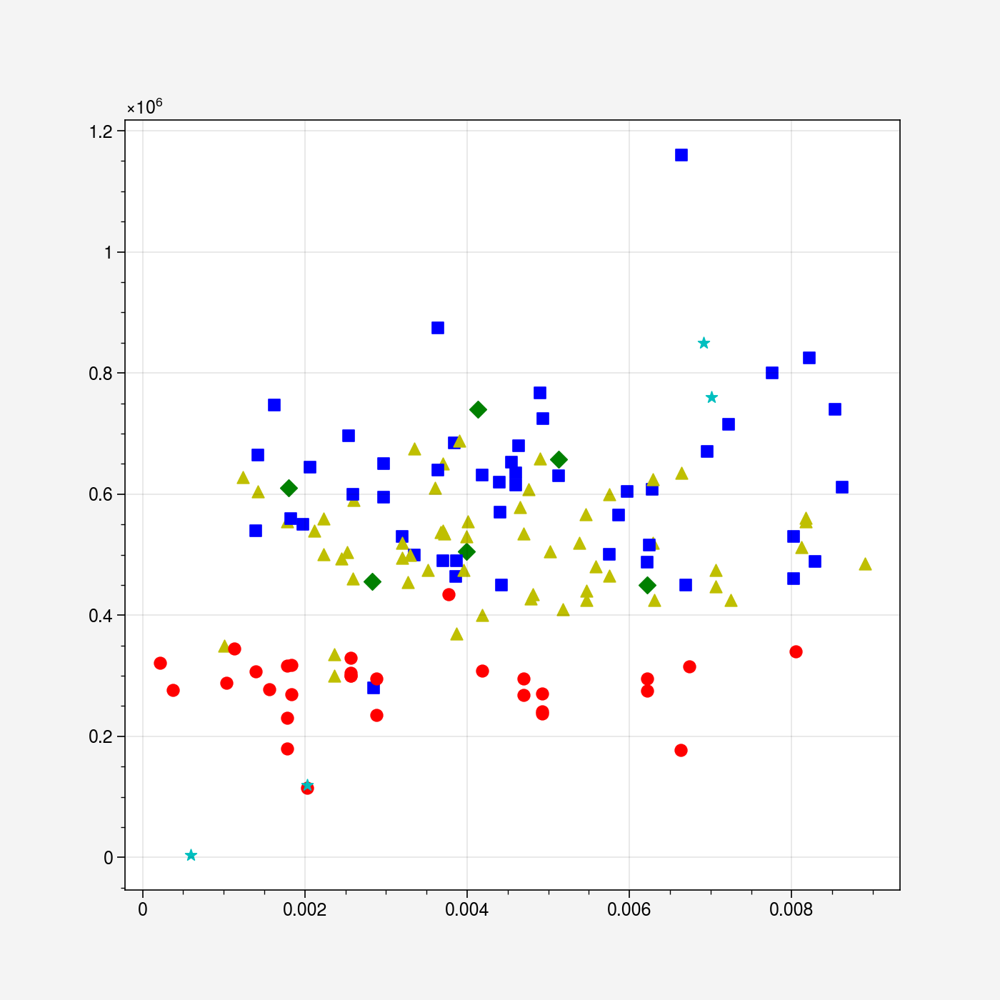

In [15]:
from shapely.geometry import Point

import proplot as pplt
import sys
import warnings
import mlai.plot as plot
if not sys.warnoptions:
    
    warnings.simplefilter("ignore")
warnings.simplefilter("ignore")

from fynesse.database_functions import get_lat_long_from_postcode
from fynesse.data_visualisation import plot_price_distance_to_osmnxpoint
l = get_lat_long_from_postcode("SM3 9SB",conn)
plot_price_distance_to_osmnxpoint(l[0],l[1],0.01,{"shop":True},conn)
  #return pois



From this we notice that there is not particularly a correlation between distance to a shop and property price.
Indeed, the defining factor for price here appears to be the property type.
We can see that properties of similar types are generally similar distances from shops, and from the map plot we can see that this is because they are generally clustered together.

Clustering of types of property is to be expected, generally when new housing developments are made, new properties of the same type are built on consecutive plots of land. They are also generally large, and the properties similar in price as the properties of each type are built to similar specifications. 

The lack of obvious correlation between property price and distance to a shop is possibly because none of the points are particularly far from a shop, but this is also an important observation. If some properties are not near a shop, then likely the whole nearby area is also not near a shop, and this means that all of those properties would be affected by having or not having shops. As we have all the locations of the sales, this fact is a feature of the general location, not of the houses themselves.

Here are a few more plots of minimum distance to different tags, namely healthcare, schools, and public transport.


/usr/local/lib/python3.7/dist-packages/proplot/figure.py:1324: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  array = array.astype(np.int)
/usr/local/lib/python3.7/dist-packages/proplot/internals/process.py:84: DeprecationWarning: `np.str` is a deprecated alias for the builtin `str`. To silence this warning, use `str` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.str_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-n

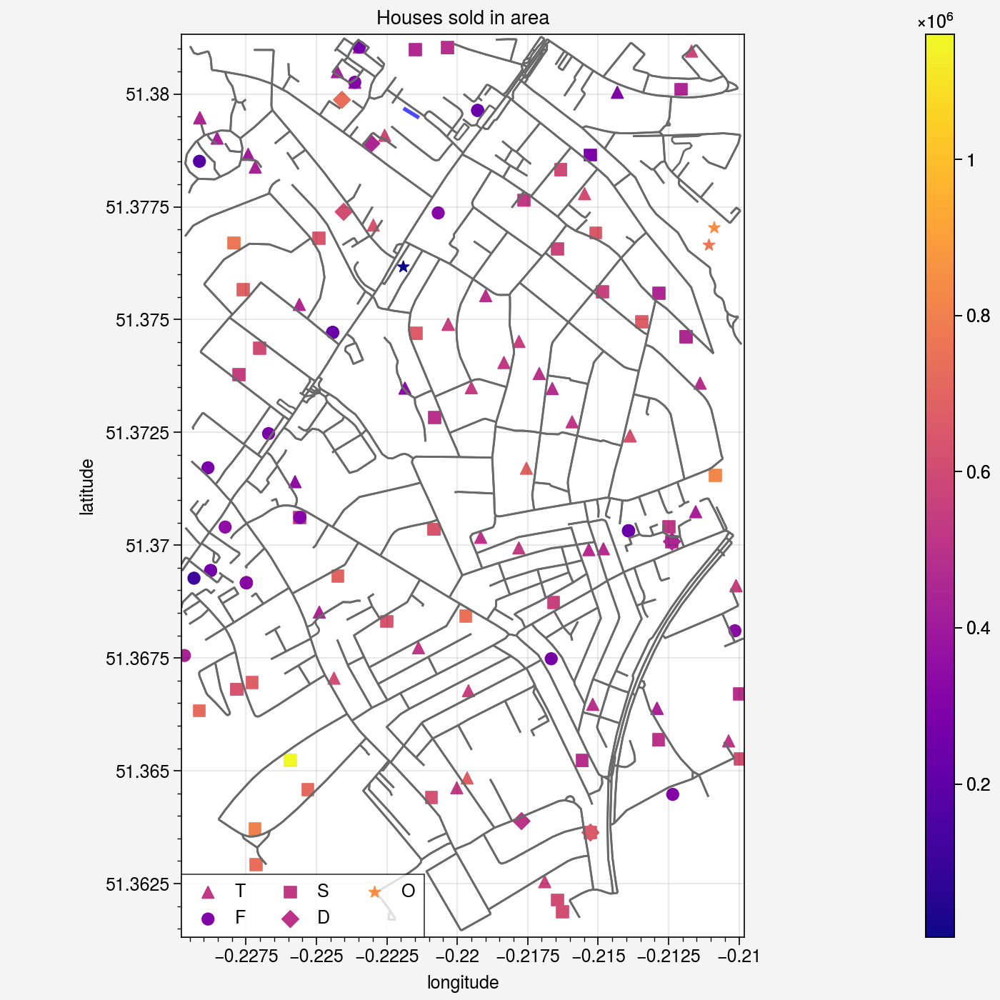

<Figure size 900x900 with 0 Axes>

/usr/local/lib/python3.7/dist-packages/fynesse/data_visualisation.py:272: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  latitudes = [x for x in pois.geometry.centroid.y]
/usr/local/lib/python3.7/dist-packages/fynesse/data_visualisation.py:274: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  longitudes = [x for x in pois.geometry.centroid.x]


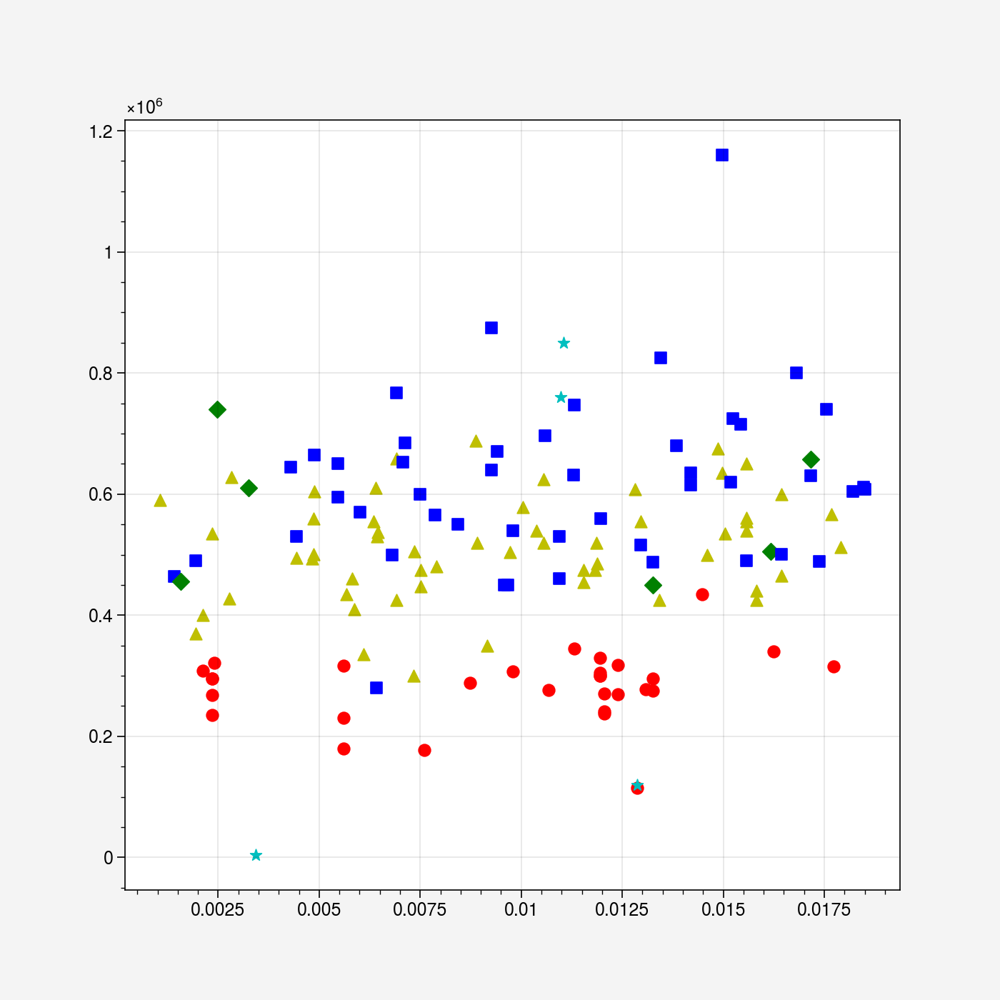

In [17]:
import sys

if not sys.warnoptions:
    import warnings
    warnings.simplefilter("ignore")
    
plot_price_distance_to_osmnxpoint(l[0],l[1],0.01,{"building":"hospital"},conn)



/usr/local/lib/python3.7/dist-packages/proplot/figure.py:1324: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  array = array.astype(np.int)
/usr/local/lib/python3.7/dist-packages/proplot/internals/process.py:84: DeprecationWarning: `np.str` is a deprecated alias for the builtin `str`. To silence this warning, use `str` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.str_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-n

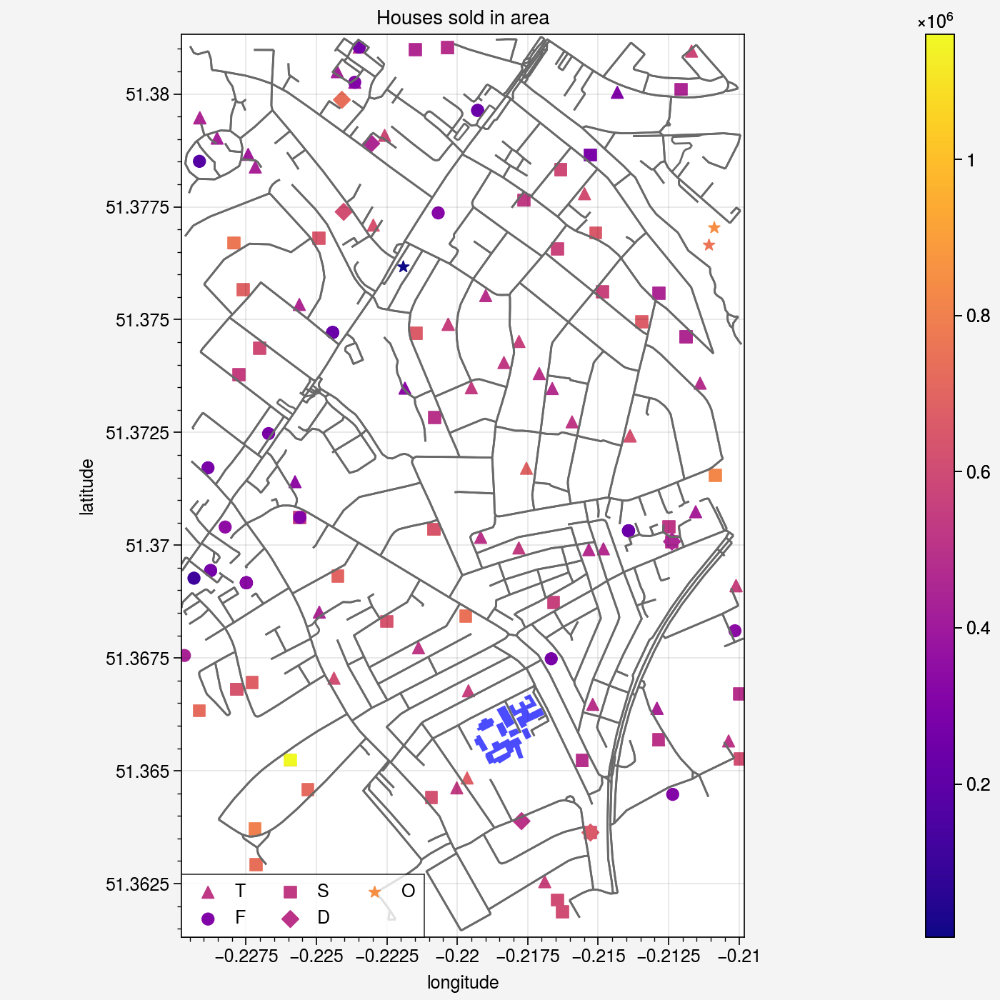

<Figure size 900x900 with 0 Axes>

/usr/local/lib/python3.7/dist-packages/fynesse/data_visualisation.py:272: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  latitudes = [x for x in pois.geometry.centroid.y]
/usr/local/lib/python3.7/dist-packages/fynesse/data_visualisation.py:274: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  longitudes = [x for x in pois.geometry.centroid.x]


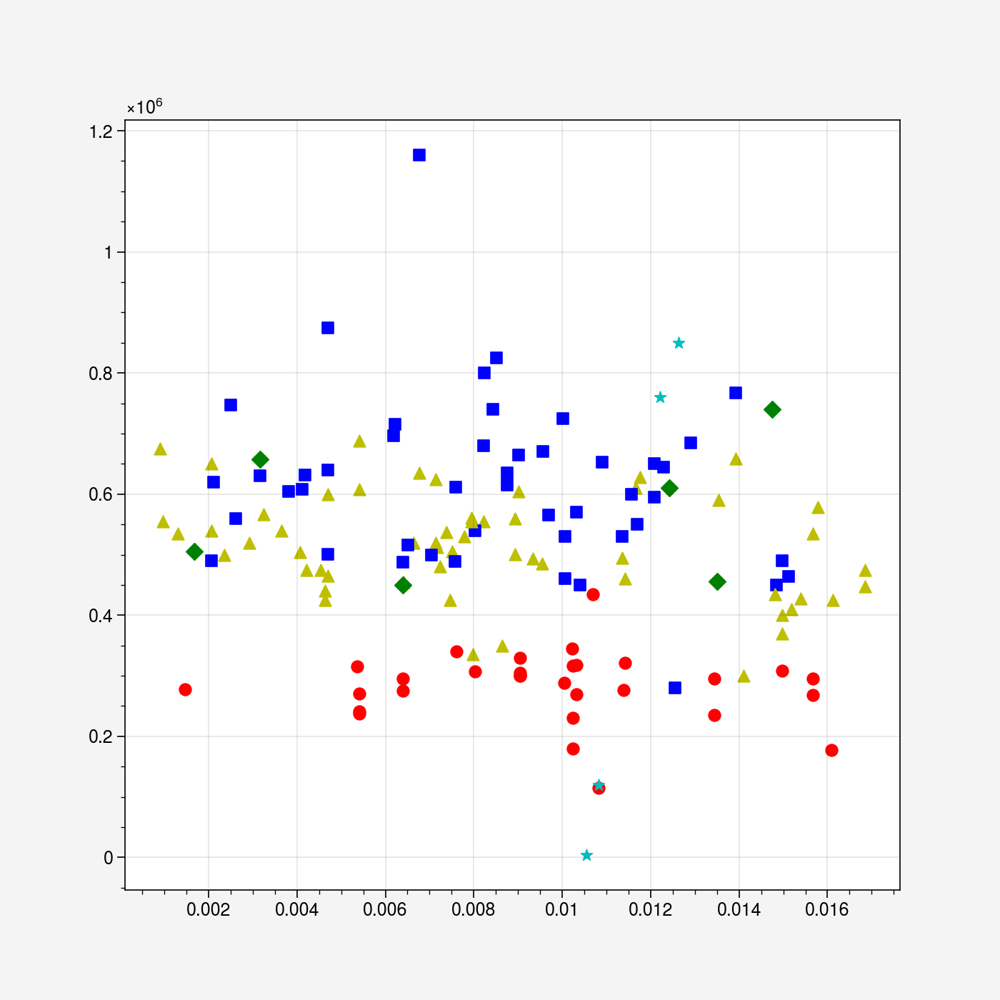

In [18]:
plot_price_distance_to_osmnxpoint(l[0],l[1],0.01,{"building":"school"},conn)


/usr/local/lib/python3.7/dist-packages/proplot/figure.py:1324: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  array = array.astype(np.int)
/usr/local/lib/python3.7/dist-packages/proplot/internals/process.py:84: DeprecationWarning: `np.str` is a deprecated alias for the builtin `str`. To silence this warning, use `str` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.str_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-n

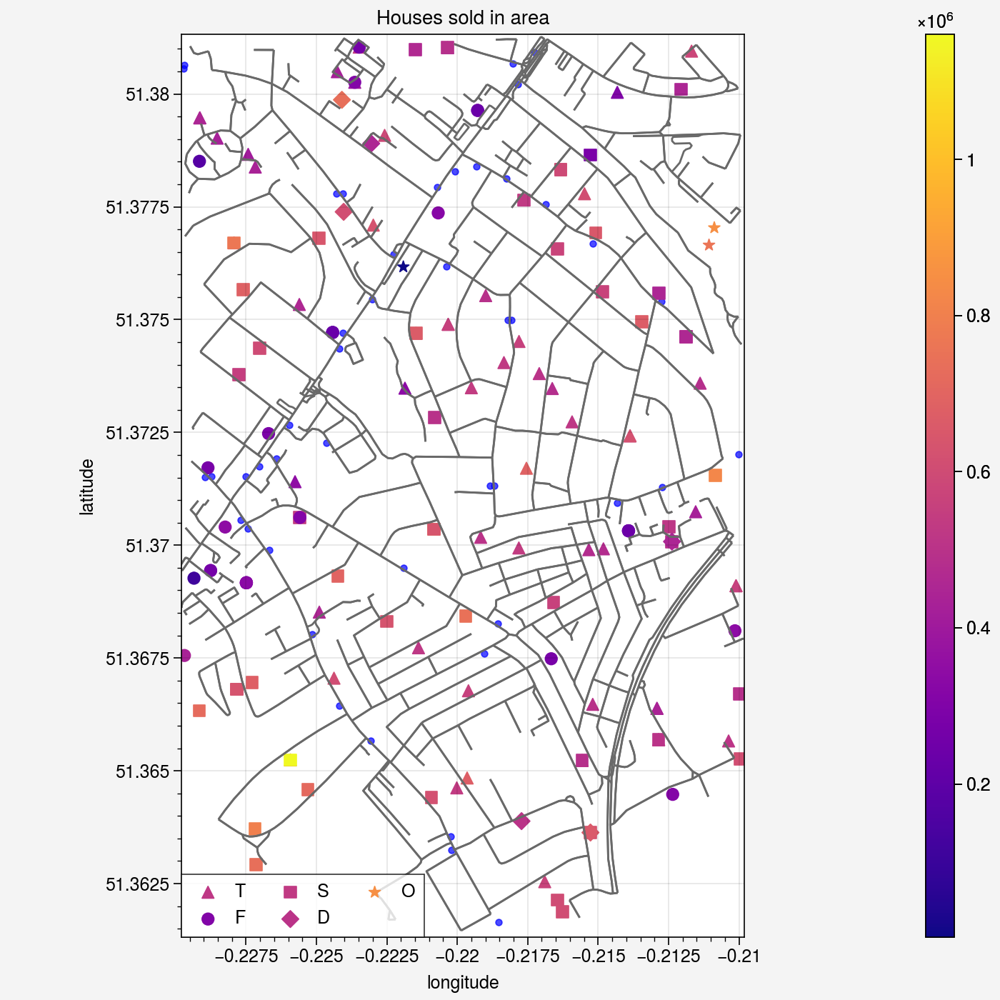

<Figure size 900x900 with 0 Axes>

/usr/local/lib/python3.7/dist-packages/fynesse/data_visualisation.py:272: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  latitudes = [x for x in pois.geometry.centroid.y]
/usr/local/lib/python3.7/dist-packages/fynesse/data_visualisation.py:274: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  longitudes = [x for x in pois.geometry.centroid.x]


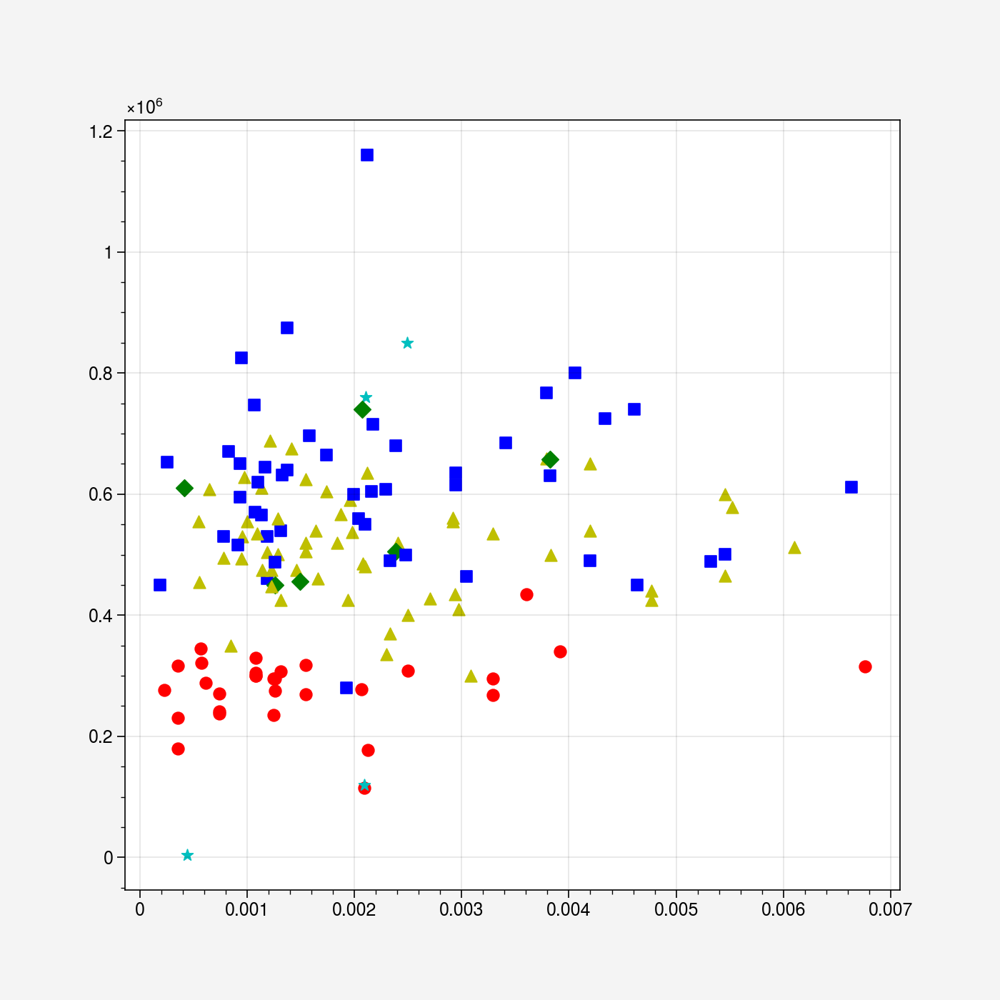

In [19]:
plot_price_distance_to_osmnxpoint(l[0],l[1],0.01,{"public_transport":True},conn)


/usr/local/lib/python3.7/dist-packages/proplot/figure.py:1324: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  array = array.astype(np.int)
/usr/local/lib/python3.7/dist-packages/proplot/internals/process.py:84: DeprecationWarning: `np.str` is a deprecated alias for the builtin `str`. To silence this warning, use `str` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.str_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-n

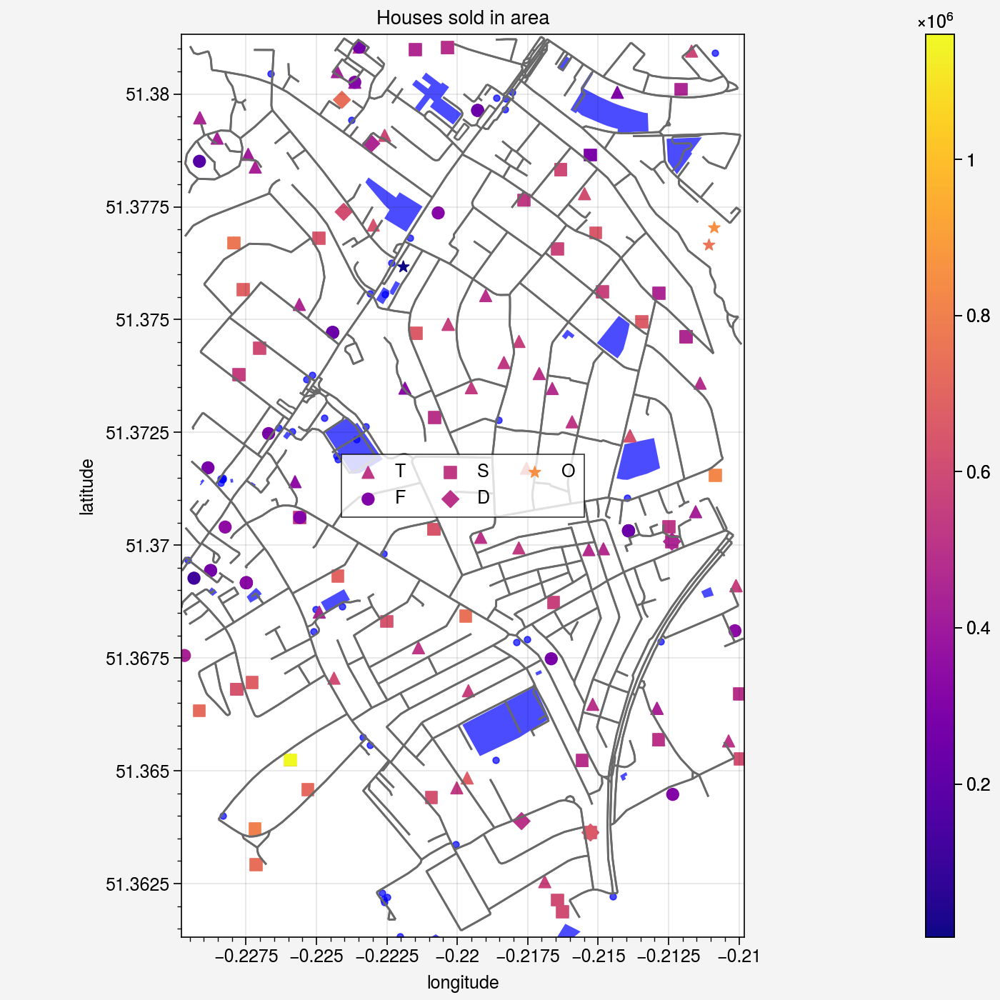

<Figure size 900x900 with 0 Axes>

/usr/local/lib/python3.7/dist-packages/fynesse/data_visualisation.py:272: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  latitudes = [x for x in pois.geometry.centroid.y]
/usr/local/lib/python3.7/dist-packages/fynesse/data_visualisation.py:274: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  longitudes = [x for x in pois.geometry.centroid.x]


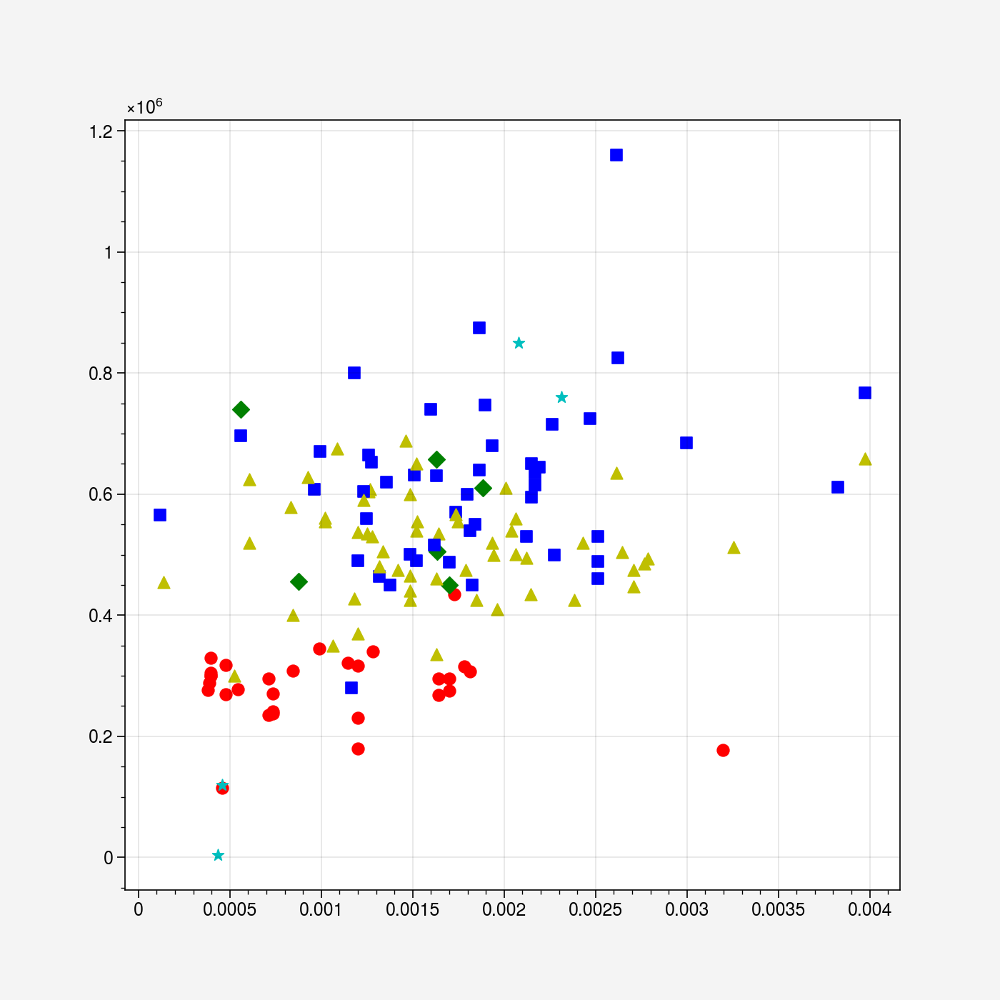

In [20]:
plot_price_distance_to_osmnxpoint(float(l[0]),float(l[1]),0.01,{"amenity":True},conn)


/usr/local/lib/python3.7/dist-packages/proplot/figure.py:1324: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  array = array.astype(np.int)
/usr/local/lib/python3.7/dist-packages/proplot/internals/process.py:84: DeprecationWarning: `np.str` is a deprecated alias for the builtin `str`. To silence this warning, use `str` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.str_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-n

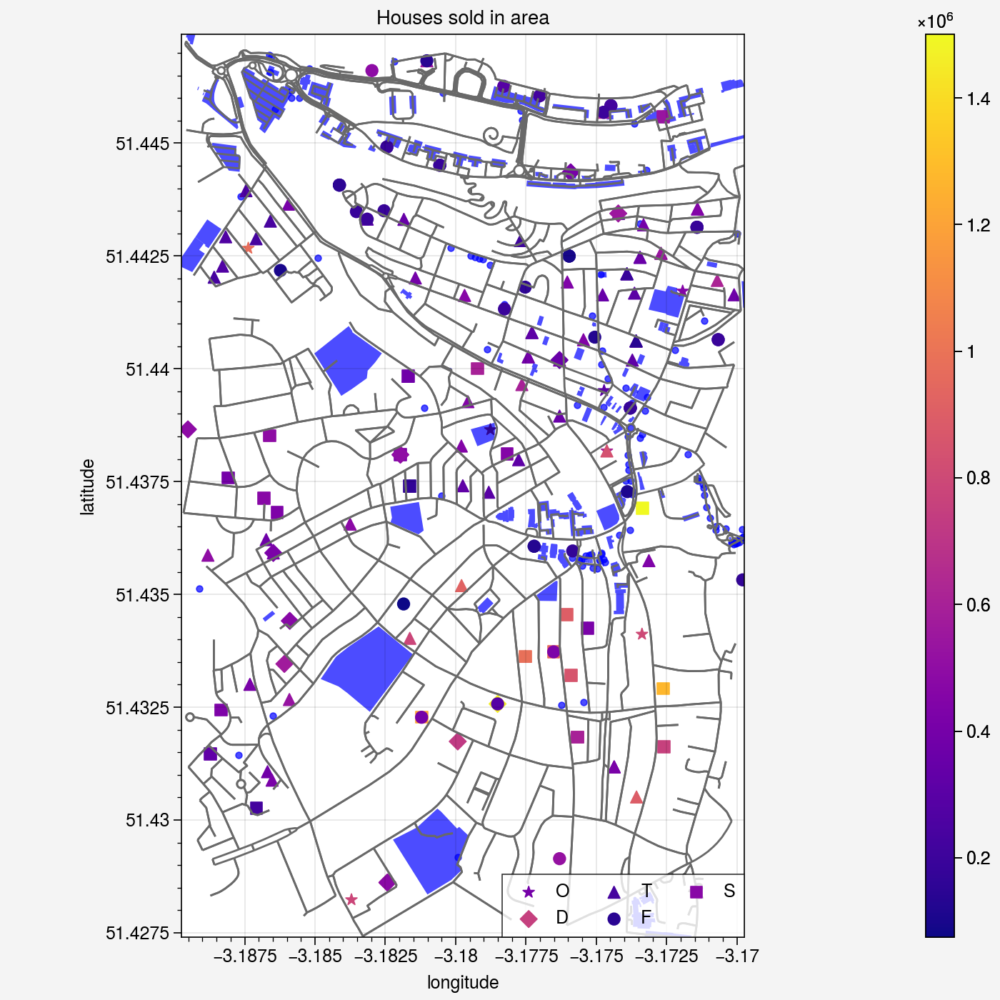

<Figure size 900x900 with 0 Axes>

/usr/local/lib/python3.7/dist-packages/fynesse/data_visualisation.py:272: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  latitudes = [x for x in pois.geometry.centroid.y]
/usr/local/lib/python3.7/dist-packages/fynesse/data_visualisation.py:274: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  longitudes = [x for x in pois.geometry.centroid.x]


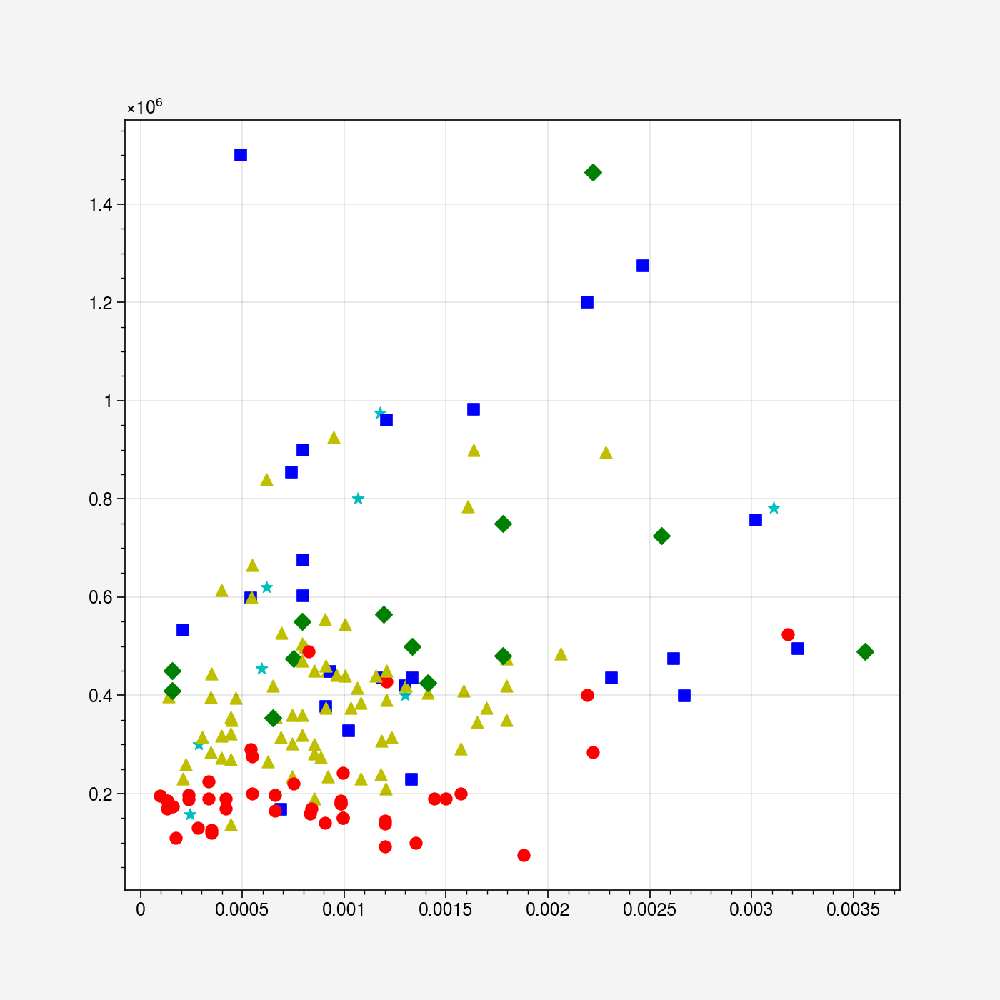

In [21]:
l = get_lat_long_from_postcode("CF64 2NH",conn)
plot_price_distance_to_osmnxpoint(float(l[0]),float(l[1]),0.01,{"amenity":True},conn)


/usr/local/lib/python3.7/dist-packages/proplot/figure.py:1324: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  array = array.astype(np.int)
/usr/local/lib/python3.7/dist-packages/proplot/internals/process.py:84: DeprecationWarning: `np.str` is a deprecated alias for the builtin `str`. To silence this warning, use `str` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.str_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-n

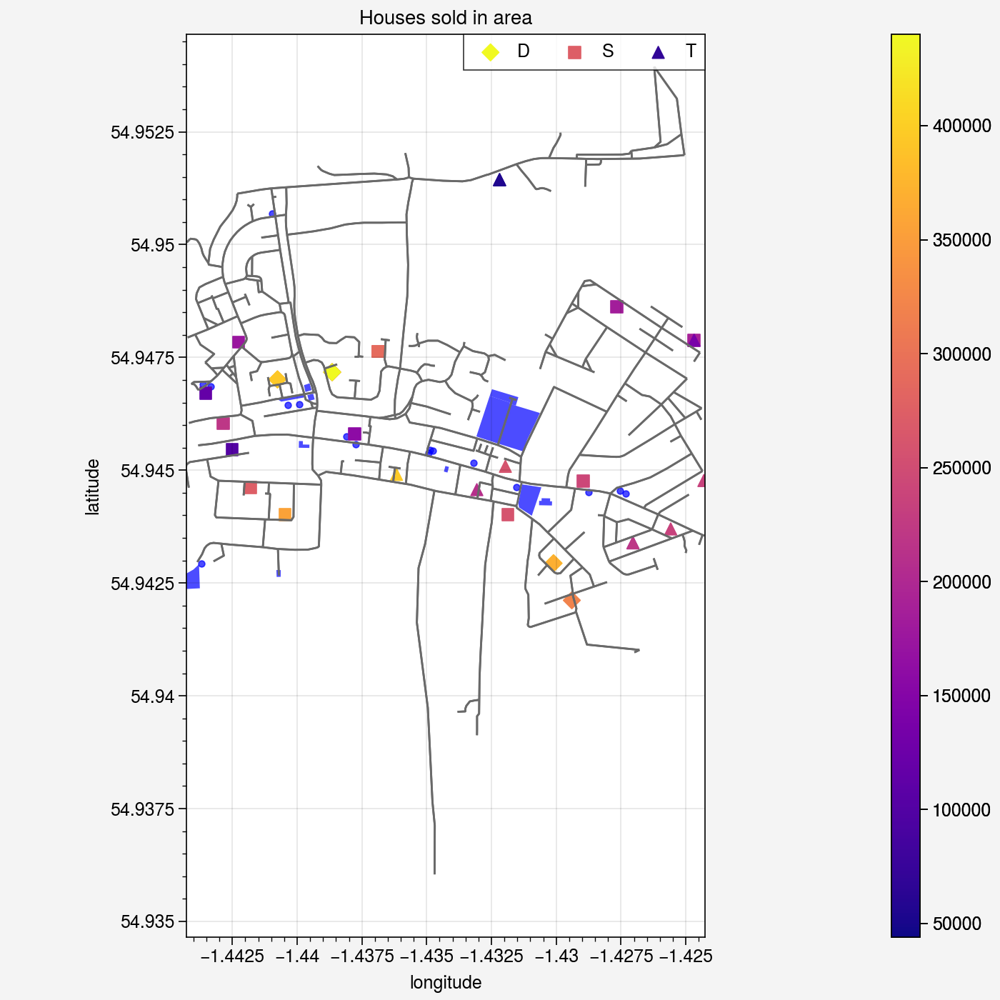

<Figure size 900x900 with 0 Axes>

/usr/local/lib/python3.7/dist-packages/fynesse/data_visualisation.py:272: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  latitudes = [x for x in pois.geometry.centroid.y]
/usr/local/lib/python3.7/dist-packages/fynesse/data_visualisation.py:274: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  longitudes = [x for x in pois.geometry.centroid.x]


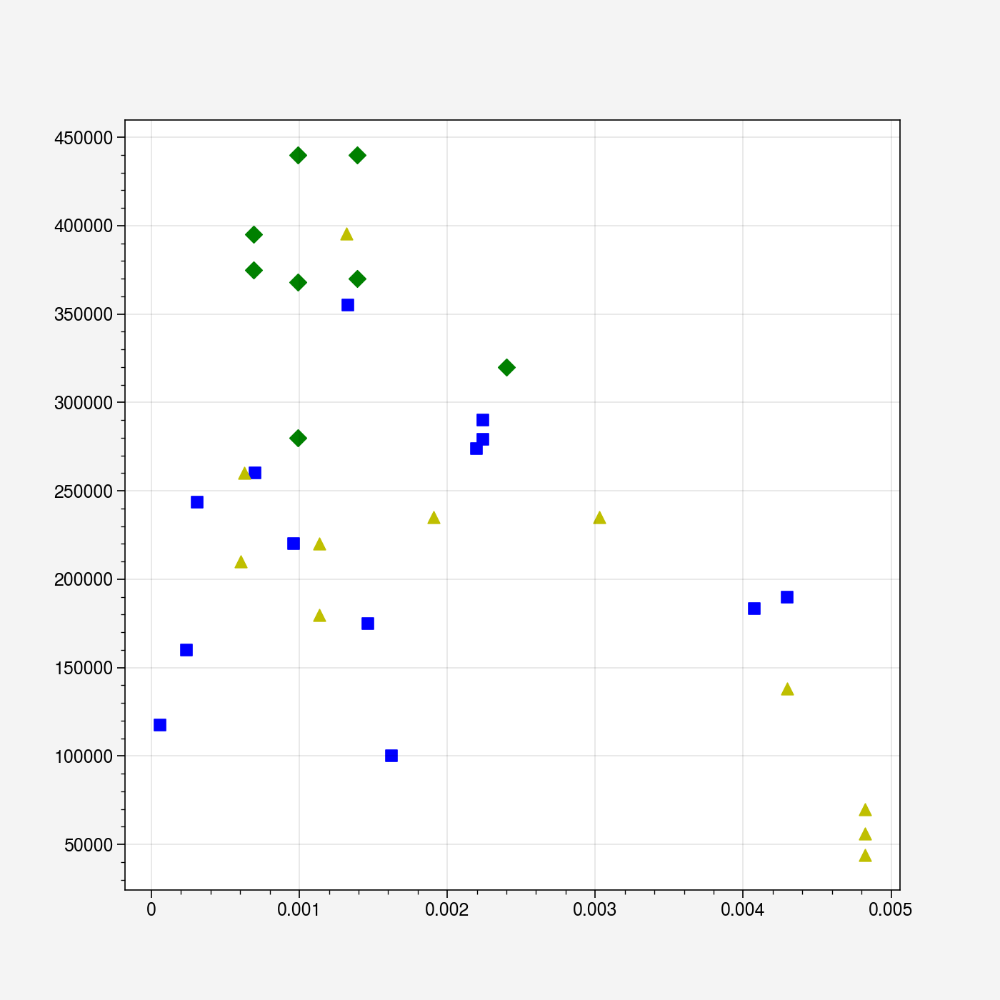

In [22]:
l = get_lat_long_from_postcode("NE36 0SS",conn)
plot_price_distance_to_osmnxpoint(float(l[0]),float(l[1]),0.01,{"amenity":True},conn)


Access to these is generally accepted to be a factor in the price of a house, but again we see no particular defining correlation.
This again is because we are looking at small bounding boxes, and therefore the distance between any one property and any of these facilities does not vary much, 2 kilometers is very much walking distance.
Further we do not have the information about these facilities that general knowledge tells us will have the defining affect. We don't know how good the hospitals are, or where the public transport goes or how frequently, or how well the schools perform.

Even if we did have these, again the fact that we have location data joined to the postcode of each property means that the effects of these are absorbed into the prices we see in the area. This means that the range in the prices for each property type is unlikely to be particularly large. Postcodes are relatively small geographically, so everything in that postcode, and in neighbouring postcodes, is affected by the same 'large' geographical features.

'Large' geographical features will therefore include rivers, parks, whether in a city or not, and most amenities.

If we want to see more about the different property prices within data, we need to consider what data we have that is more granular than the postcode itself.

Because we don't have the individual locations of each property, the more individual data for each property that we have is the type of property, whether or not it is a new build, and also its address.

We could try to match addresses from the paid price data to points tagged as buildings in the OSM data, this could help better identify the location of the properties. However, looking at the number of points quickly shows that that is unlikely to be a generally reliable action.

According to the office of national statistics (https://www.ons.gov.uk/peoplepopulationandcommunity/housing/articles/researchoutputssubnationaldwellingstockbytenureestimatesengland2012to2015/2020) there are 24.7 million dwellings in the UK. On OSM the number of buildings tagged with residential, semidetached, detached, terrace, house, or appartments is approximately 6million. Significantly less.

Further, the number of these that have an address tagged on them, is only about half.

However, this does give an idea, that maybe looking at the size of the residential buildings plotted will have some correlation with prices.

The idea here is that homes that occupy more land will cost more. The area of a building also includes any additional extensions made to it, which would likely affect property price.

This is examined below:

/usr/local/lib/python3.7/dist-packages/fynesse/data_visualisation.py:302: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  pois['size'] = pois.geometry.area
/usr/local/lib/python3.7/dist-packages/fynesse/data_visualisation.py:307: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  latitudes.extend([x for x in pois.geometry.way.centroid.y])
/usr/local/lib/python3.7/dist-packages/fynesse/data_visualisation.py:309: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  longitudes.extend([x for x in pois.geometry.way.centroid.x])


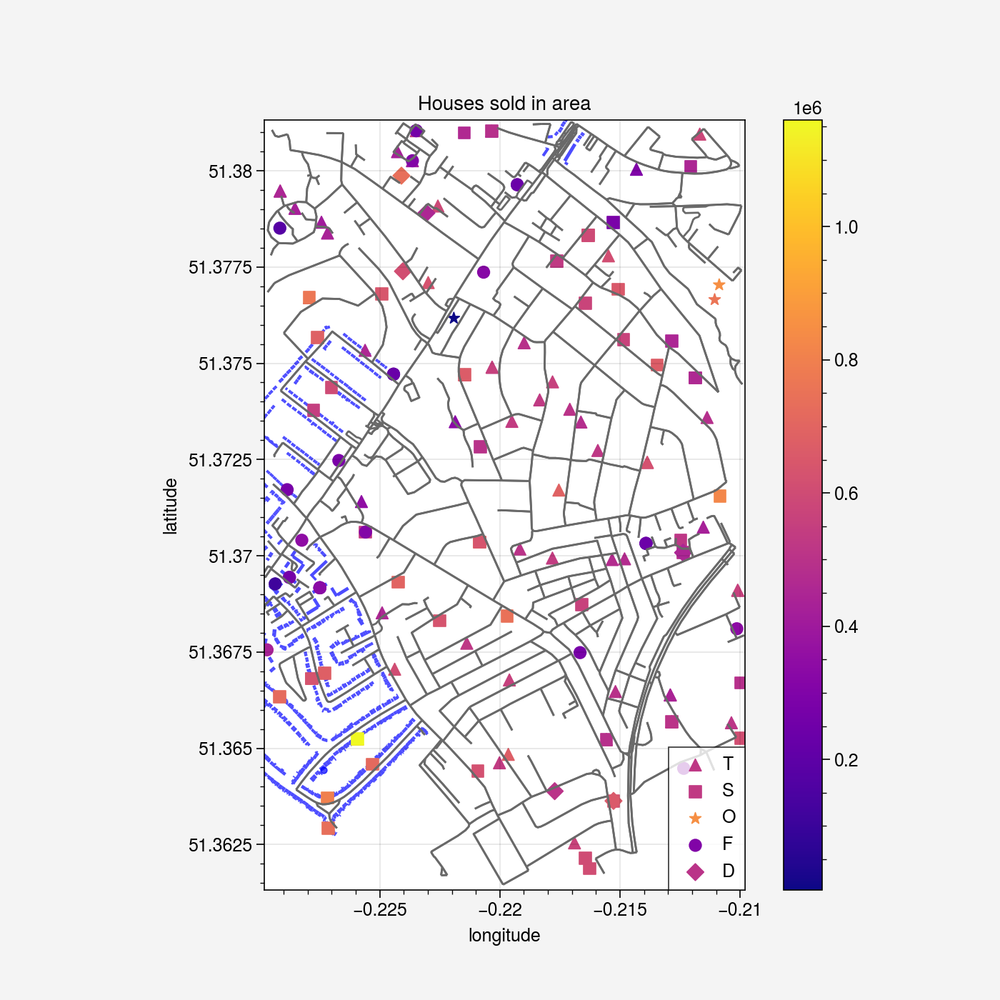

<Figure size 900x900 with 0 Axes>

ValueError: ignored

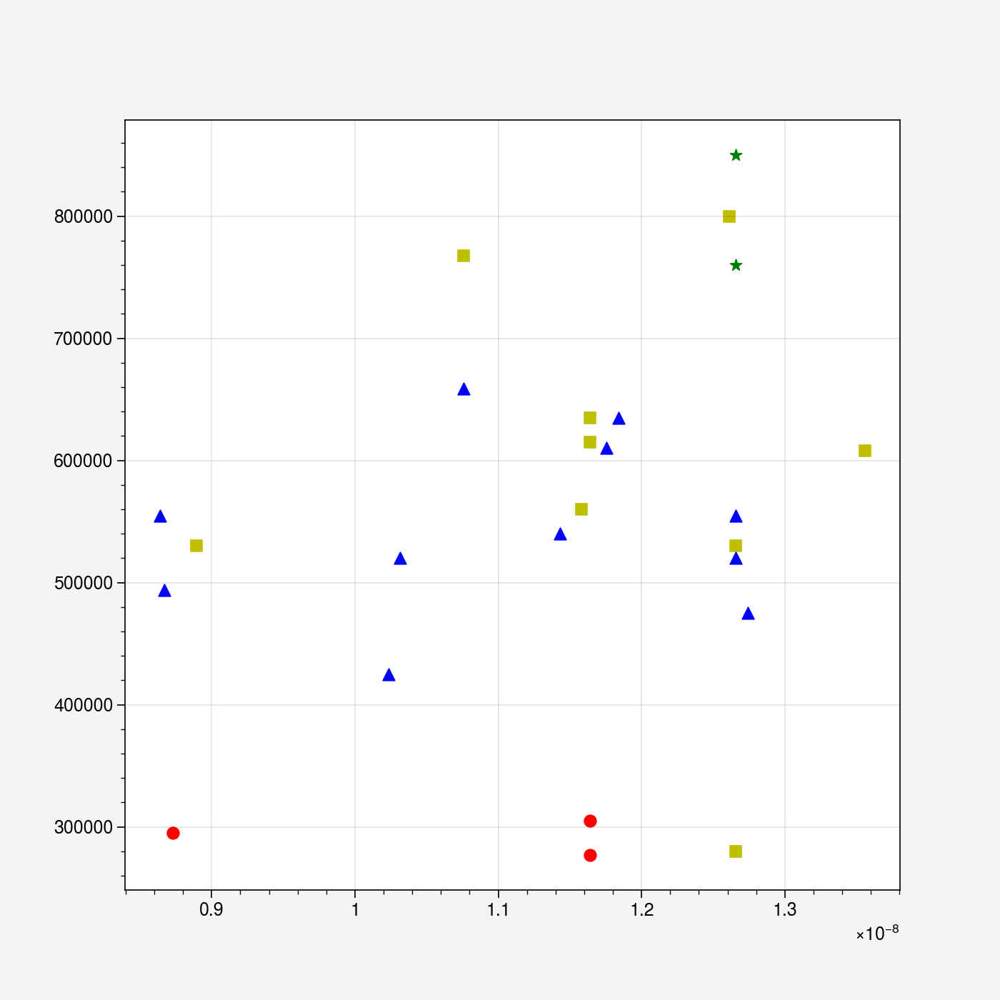

In [24]:
from scipy.stats.morestats import sqrt
import osmnx as ox
import pandas as pd
import mlai.plot as plot
import geopandas as gpd
import numpy as np 
import proplot as pplt

from fynesse.data_visualisation import plot_price_to_sizeIn_radius

l = get_lat_long_from_postcode("SM3 9SB",conn)
'''
plot_price_distance_to_osmnxtag(float(l[0]),float(l[1]),0.01,"amenity",['hospital','shop'],conn)
l = get_lat_long_from_postcode("CF64 2NH",conn)
plot_price_distance_to_osmnxtag(float(l[0]),float(l[1]),0.01,"amenity",['hospital','shop'],conn)
l = get_lat_long_from_postcode("NE36 0SS",conn)
plot_price_distance_to_osmnxtag(float(l[0]),float(l[1]),0.01,"amenity",['hospital','shop'],conn)
l = (51.345923,-1.493055)
plot_price_distance_to_osmnxtag(float(l[0]),float(l[1]),0.01,"amenity",['hospital','shop'],conn)
l = (51.371669,-3.112082)
plot_price_distance_to_osmnxtag(float(l[0]),float(l[1]),0.01,"amenity",['hospital','shop'],conn)'''





  #pointsbyx = pois[(abs(pois['latitude'] - x['latitude']) + abs(pois['longitude'] - x['longitude'])) < radius ]
    
plot_price_to_sizeIn_radius(float(l[0]),float(l[1]),0.01,conn)

We see that properties of the same type tend to be slightly more likely to have a similar size. This makes sense for this data point because it is in a suburb, the majority of the properties were built within a few years of each other to the same specifications as part of a large housing development, thus the buildings are likely to be the same size.
Semi-detached properties do tend to be larger than terraced properties, and they are clustered at a larger price.
This may help a little bit with the prediction model, as the model can look at buildings around the point, and use those buildings to aid the prediction as there is unlikely to be much data for the immediate area around the point itself.

From the analysis above, it can be concluded that, where there is sufficient price paid data for properties in an immediate area, the most important predictor of prices in that immediate area will be the prices of the nearest properties of the same property type.

This we conclude, is because affects of local amenities, and ground types, are already absorbed into our price paid data for each postcode and surrounding area.

###Where the OSM data might be useful is for locations where there is very little or no price paid data.

These locations come under these categories:


*   An invalid location, for example, in the sea, or in another country
*   In an area where there are no houses because the land is protected, for example parkland, nature reserves, or forests.
* In areas where the land is used for commercial or industrial purposes, so people do not live there.
* In areas that are largely farmland, with few houses, so few properties are sold in the area.

In the first three instances, it is very unlikely that a house would exist there, let alone be sold, and these cases could be identified by looking at landuse tags, and checking that there are nearby postcodes. 

In the third, a house sold would either be a newbuild, or one of the very few properties in the area, but there would be no guarantee that any of them are listed in the paid price dataset, and particularly not around a particular year. In this case, it might be pertinent to look at an average based on newbuilds in a wider area, although this would need to be done with caution.



#### Using osmnx data to analyse factors that cause higher house prices

This could be one focus of this data, but is not part of the project.

Someone looking to do so could use the plotting functions written for this project, as they are resuable. For example they may look at numbers of a type of tag in a district, compared to price.

However, it would be very easy to find spurious correlations in this manner. There is a lot of historical and geographical context that influences each factor, and it would require an expert at hand to make reasonable judgements on these in a way that would consider the people who live in these places, and be accurate.

One example could be that access to public amenities could be considered a factor for house prices, when it is the local governments that build them, and thus this is more of a reflection on wealth of people in the area. It is expected that poor people are more likely to be buying cheaper houses than rich people, and that thus their areas would be more deprived due to lower funding.

### hide

In [ ]:
def stats(lis):
  for l in lis:
    print(np.mean(l))
    print(np.var(l))
    print(np.std(l))
    print(np.max(l))
    print(np.min(l))
    print(np.median(l))
    print(l[:10])
    print(l[-10:])

def stats_propertytype():
  flatsprices = get_prices_by_property_type('F')
  terracedprices = get_prices_by_property_type('T')
  semiprices = get_prices_by_property_type('S')
  detachedprices = get_prices_by_property_type('D')
  stats([flatsprices,terracedprices,semiprices,detachedprices,np.concatenate([flatsprices,terracedprices,semiprices,detachedprices])])

stats_propertytype()


298126.8052819773
223338532545.40186
472587.0634554038
60000000
11000
215000.0
[449950, 92000, 270000, 165000, 145000, 220000, 195000, 100000, 124500, 118500]
[176000, 462000, 465000, 750000, 362500, 910000, 1500000, 575000, 378000, 250000]
290525.3726271301
281148228062.8061
530234.1257056227
120000000
12000
214000.0
[160000, 165500, 131500, 170000, 262000, 139950, 180000, 330000, 185000, 80000]
[544000, 619500, 530000, 429000, 635000, 432000, 432000, 510000, 635000, 895000]
315291.1377753136
92437104935.84561
304034.7100839732
37500000
10285
255000.0
[200000, 270000, 367550, 205000, 500000, 742000, 171100, 210000, 255000, 205000]
[420000, 710000, 390000, 385000, 345000, 317000, 1050000, 585000, 950000, 540000]
531095.478683831
228027871981.31396
477522.64028139436
36500000
2400
420000.0
[245000, 228500, 380000, 520000, 270000, 175000, 315000, 560000, 445000, 377000]
[582000, 600000, 560000, 575000, 407000, 370000, 560000, 550000, 960000, 775000]
351241.959136588
214822602914.35437
46

### again not hide

In [ ]:
def get_avg_price(conn):
  cur = conn.cursor()
  cur.execute(f"""
    SELECT district, AVG(price) FROM prices_coordinates_data GROUP BY district ;
  """)
  return dict(cur.fetchall())
r = get_avg_price(conn)
r.keys()

dict_keys(['ADUR', 'ALLERDALE', 'AMBER VALLEY', 'ARUN', 'ASHFIELD', 'ASHFORD', 'BABERGH', 'BARKING AND DAGENHAM', 'BARNET', 'BARNSLEY', 'BARROW-IN-FURNESS', 'BASILDON', 'BASINGSTOKE AND DEANE', 'BASSETLAW', 'BATH AND NORTH EAST SOMERSET', 'BEDFORD', 'BEXLEY', 'BIRMINGHAM', 'BLABY', 'BLACKBURN WITH DARWEN', 'BLACKPOOL', 'BLAENAU GWENT', 'BOLSOVER', 'BOLTON', 'BOSTON', 'BOURNEMOUTH, CHRISTCHURCH AND POOLE', 'BRACKNELL FOREST', 'BRADFORD', 'BRAINTREE', 'BRECKLAND', 'BRENT', 'BRENTWOOD', 'BRIDGEND', 'BRIGHTON AND HOVE', 'BROADLAND', 'BROMLEY', 'BROMSGROVE', 'BROXBOURNE', 'BROXTOWE', 'BUCKINGHAMSHIRE', 'BURNLEY', 'BURY', 'CAERPHILLY', 'CALDERDALE', 'CAMBRIDGE', 'CAMDEN', 'CANNOCK CHASE', 'CANTERBURY', 'CARDIFF', 'CARLISLE', 'CARMARTHENSHIRE', 'CASTLE POINT', 'CENTRAL BEDFORDSHIRE', 'CEREDIGION', 'CHARNWOOD', 'CHELMSFORD', 'CHELTENHAM', 'CHERWELL', 'CHESHIRE EAST', 'CHESHIRE WEST AND CHESTER', 'CHESTERFIELD', 'CHICHESTER', 'CHORLEY', 'CITY OF BRISTOL', 'CITY OF DERBY', 'CITY OF KINGSTON UPON

## Question 3. Addressing a Property Price Prediction Question

For your final tick, we will be asking you to make house price predictions for a given location, date and property type in the UK. You will provide a function that takes input a latitude and longitude as well as the `property_type` (either type" of property (either `F` - flat, `S` - semidetached, `D` - detached, `T` - terraced or `O` other). Create this function in the `address.py` file, for example in the form,

```
def predict_price(latitude, longitude, date, property_type):
    """Price prediction for UK housing."""
    pass
```

We suggest that you use the following approach when building your prediction. 

1. Select a bounding box around the housing location in latitude and longitude.
2. Select a data range around the prediction date. 
3. Use the data ecosystem you have build above to build a training set from the relevant time period and location in the UK. Include appropriate features from OSM to improve the prediction.
4. Train a linear model on the data set you have created.
5. Validate the quality of the model.
6. Provide a prediction of the price from the model, warning appropriately if your validation indicates the quality of the model is poor.

The knowledge you need to do a first pass through this question will have been taught by end of lab session four (25th November 2021). You will likely want to review your answer as part of *refactoring* your code shortly before hand in.



###0. Validate the inputs from the user
This is the first port of call, we want to be sure that the date, longitude and latitude given to us are reasonable to predict prices from.

The checks performed are that there are nearby postcodes (within 10km), that the coordinates are on land, and that the date is within the bounds of those covered by the paid price data.

These help check that our model will be able to make reasonable predictions without extrapolation.

In [ ]:
#validate_inputs(latitude, longitude, date, property_type,conn)

###1.Select a bounding box around the housing location in latitude and longitude.

From the analysis done in question 2, a reasonable initial bounding box radius is 0.01 degrees (about 1km). It is small enough to minimise the range in the property prices, but large enough to cover the local area.





###2.Select a date range around the prediction date
From analysis in question 2, it is unreasonable to try to account for inflation.

Not enough properties in the same area are sold and resold to see much more than rises in the average price over time. Further, as we do not have enough data to differentiate the interior of properties from each other, we are unable to account for whether the interior affected the price and expensive properties were simply sold at a certain time by chance, or whether their prices were affected by inflation.

Therefore selecting a blanket two year bounding box allows more property sales to be captured without incorporating too much of an affect from inflation.

###3.Use the data ecosystem you have built above to build a training set from the relevant time period and location in the UK. Include appropriate features from OSM to improve the prediction.
First select from our price paid data and postcode data to evaluate whether or not our bounds have given us reasonable data.

If we do not have very many points, warn the user that we do not have many points to work with and that our prediction may not be accurate.

If we find no points, then try to work out which of the cases it is:
* In an area where there are no houses because the land is protected, for example parkland, nature reserves, or forests.
* In areas where the land is used for commercial or industrial purposes, so people do not live there.
* In areas that are largely farmland, with few houses, so few properties are sold in the area. 

If one of the first two are true, we will be able to tell from the landuse in the area, and if the third is true the landuse will likely be farming. 
In that case we will first try increasing the bounding box size to check if there are other nearby points, but if not, let the user know what happened and give them an estimate for newbuilds in the district.

We should also check that there are properties of the same type as we are looking for in the bounding box, otherwise the model will try to extrapolate.

####Build the training dataset
The training parameters chosen are as follows:


1.   latitude and longitude - this is to help account positionally for the location of the property, as properties are often clustered by price and type
2.   mean_close_price - the is the mean of prices in a 500m radius from each property to account for general prices of buildings if there are none nearby of the same property type.
3.   mean_price_of_propertytype_close - this is the mean price of properties of the same type to the property in a 500m radius of each property, which we expect to be very important if we have it. Especially as on boundaries between expensive and less expensive property, we expect the type of property to be different.
4.   mean_price_of_isnewbuild_close - differentiates the prices of newbuilds in the area of up to a kilometer from each property, will also help as newbuilds tend to be more expensive than non-newbuilds
5. avg_size_of_ptype - the mean size of residential buildings within a radius of a 100m from each property (selected from the OSMNX data as it is the most granular data we have available)

These along with the actual price of each property is used to train the model. 

####Cleaning the data
It is good that these are all simple linears because that means that if data points are missing for any of these, we can preclean the data to change NaN's to 0s which do not have an affect on the valiues.
We also remove all value where the price is more than two standard deviations from the mean to help remove erroneous and anomalous datapoints.

###4.Train a linear model on the data set you have created.
This is done by passing the training paramaters we have decided on to an OLS training model. Using an OLS linear model allows us to use the individual variables as seperate values, and to see which ones affexts our predictions as we make them. 

###5.Validate the quality of the model.
We can do this by looking at the variance in our model to find a confidence interval in our predictions, and by looking at the summary of the model. 
We also have warning flags throughout the previous steps that warn the user if the data or inputs received are not appropriate or not a large enough data set to make a prediction that we are confident in.

Multiple points were used to check data in areas

###6.Provide a prediction of the price from the model, warning appropriately if your validation indicates the quality of the model is poor.
Now we turn the sample points set during tick 4:

In [ ]:
%pip install shapely

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:

import warnings
warnings.filterwarnings("ignore")




#predict_price(52.1461492,-0.0475104,2022,'S',conn)
#loc,houses = select_houses_in_radius_around_postcode("N12 9BL",0.01,conn)
#predict_price(float(loc[0]),float(loc[1]),2022,'S',conn)

Tick:

Location 1: 
A seaside apartment, 

In [10]:
from fynesse.address import predict_price
predict_price(50.7693314,0.1285943,2021,'F',conn)

Not many houses were sold in this area, we only found 69, this data might not be very accurate
There aren't many properties of that type near here, this prediction may not be accurate


NameError: ignored

/usr/local/lib/python3.7/dist-packages/fynesse/data_visualisation.py:302: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  pois['size'] = pois.geometry.area
/usr/local/lib/python3.7/dist-packages/fynesse/data_visualisation.py:307: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  latitudes.extend([x for x in pois.geometry.way.centroid.y])
/usr/local/lib/python3.7/dist-packages/fynesse/data_visualisation.py:309: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  longitudes.extend([x for x in pois.geometry.way.centroid.x])


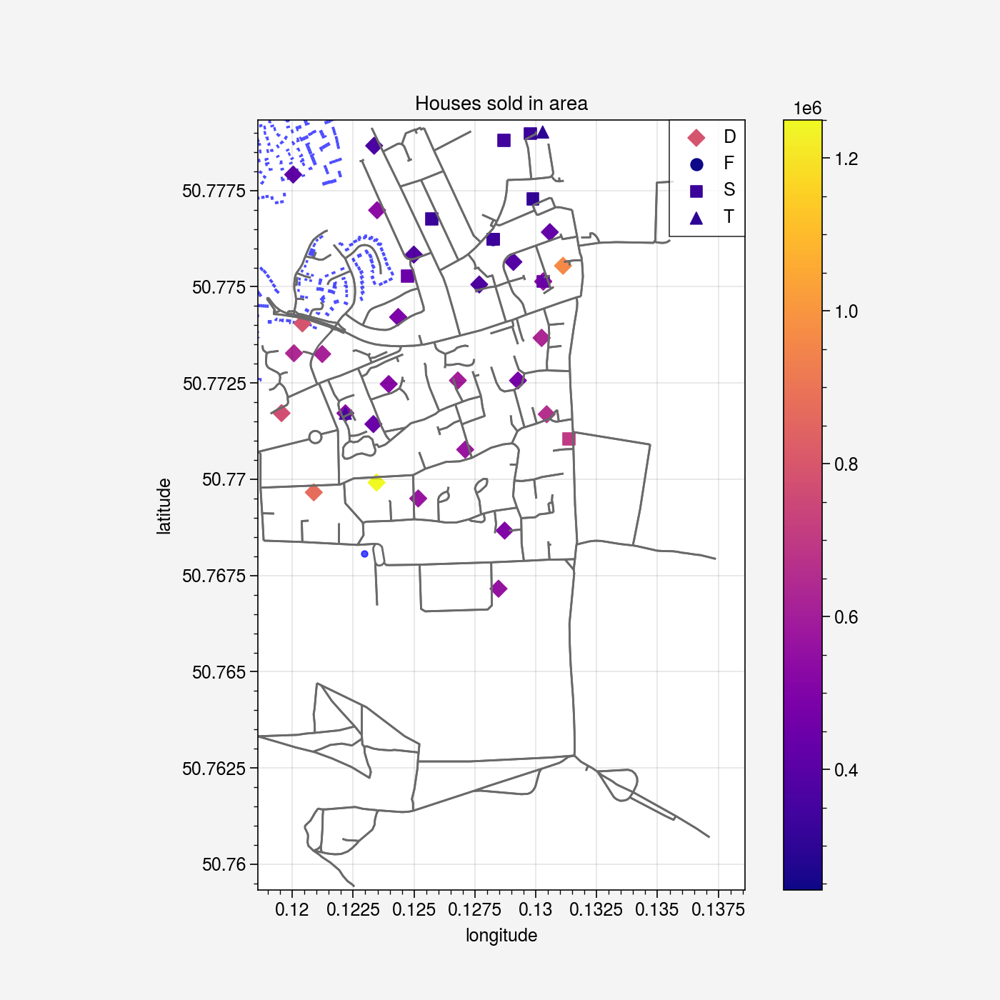

<Figure size 900x900 with 0 Axes>

In [14]:
from fynesse.data_visualisation import get_houses_sizes, plot_map, plot_houses
import mlai.plot as plot


plot_houses__radius(50.7693314,0.1285943,0.01,conn)

In [ ]:
predict_price(53.3589907,-1.491815,2021,'D',conn)

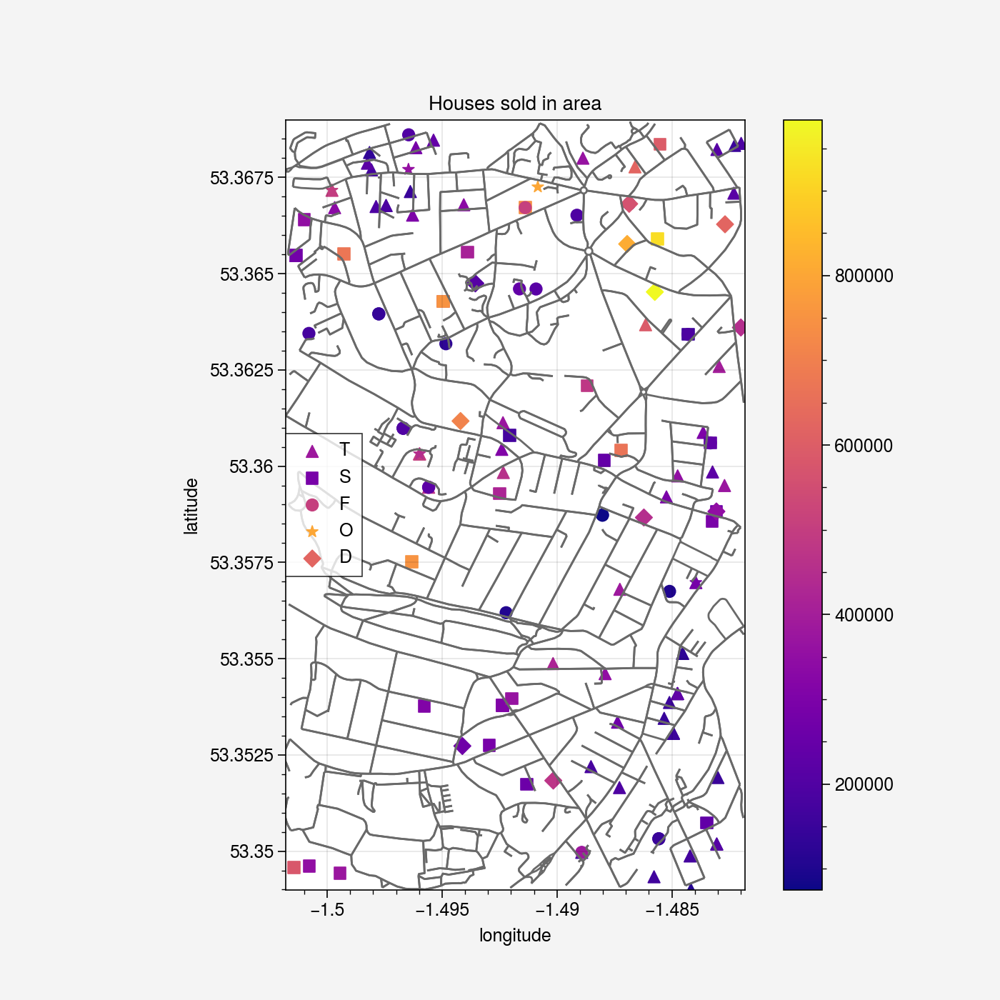

<Figure size 900x900 with 0 Axes>

In [18]:
from fynesse.data_visualisation import select_houses_in_radius_around_point
def plot_houses__radius(latitude,longitude,radius,conn):
  houses = select_houses_in_radius_around_point(latitude,longitude,radius,conn)
  fig,ax = plt.subplots(figsize=plot.big_figsize)
  plot_map(latitude,longitude,radius,ax)
  #pois.plot(ax=ax, color="blue", alpha=0.7, markersize=10)
  plot_houses(houses,ax,fig)
plot_houses__radius(53.3589907,-1.491815,0.01,conn)

I predict £551146.35
This is the variance of our model 10164521504.215767
Standard deviation = 100819.25165471011

These are the prediction parameters             
mean       mean_se  mean_ci_lower  mean_ci_upper   obs_ci_lower  \
0  551146.355233  16867.553571  517947.043001  584345.667465  349952.321149   

  obs_ci_upper  
0  752340.389317  

This is a reasonable prediction, the variance isn't large, and a comparison to average prices in the area on rightmove gives similar values.

In [ ]:
predict_price(51.3815042,-0.2554954,2021,'S',conn)

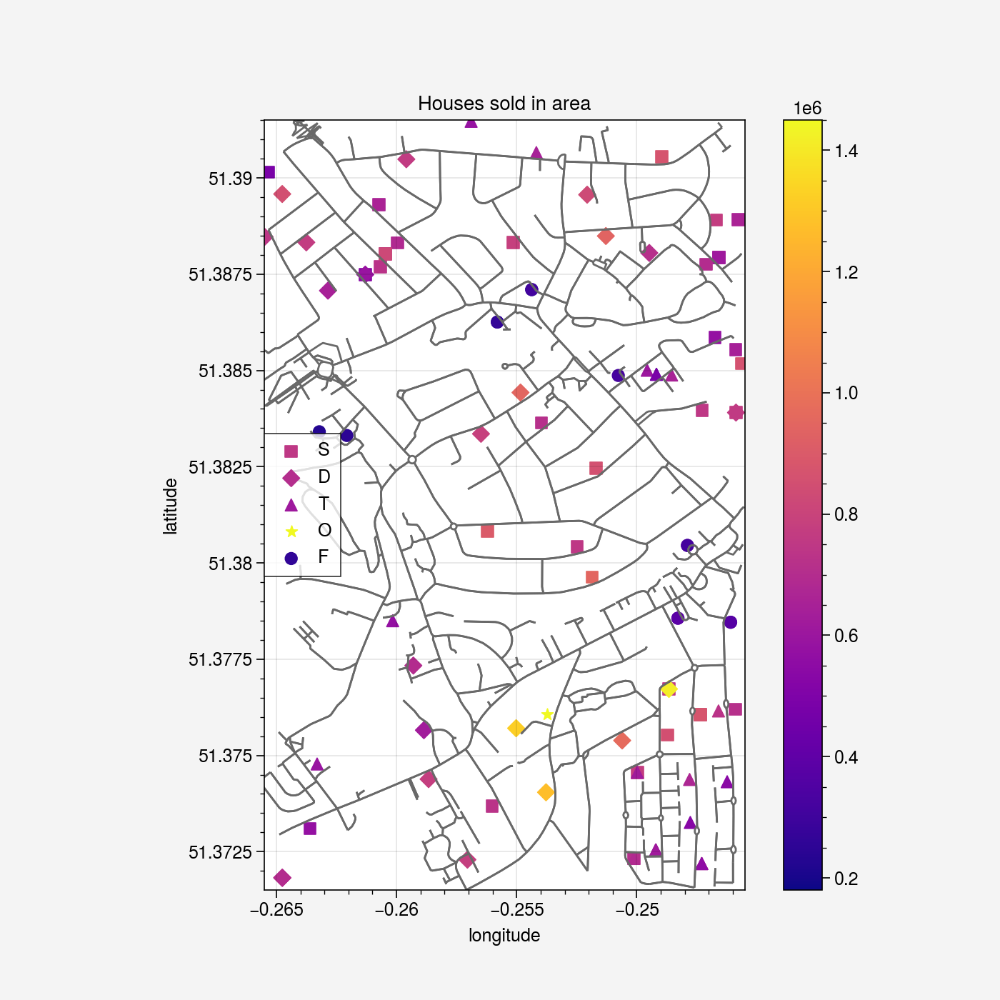

<Figure size 900x900 with 0 Axes>

In [19]:
plot_houses__radius(51.3815042,-0.2554954,0.01,conn)

I predict £675796.89
This is the variance of our model 7337885106.46218
Standard deviation = 85661.45636435432

These are the prediction parameters            
    mean       mean_se  mean_ci_lower  mean_ci_upper   obs_ci_lower  \
 675796.898115  14540.596644  647043.868467  704549.927764  503984.250129   
   
   obs_ci_upper  
  847609.546102  

  This is a reasonable prediction, the variance isn't large, and a comparison to average prices in the area on rightmove gives similar values.

In [ ]:
predict_price(53.3967492,-1.7259923,2021,'O',conn)

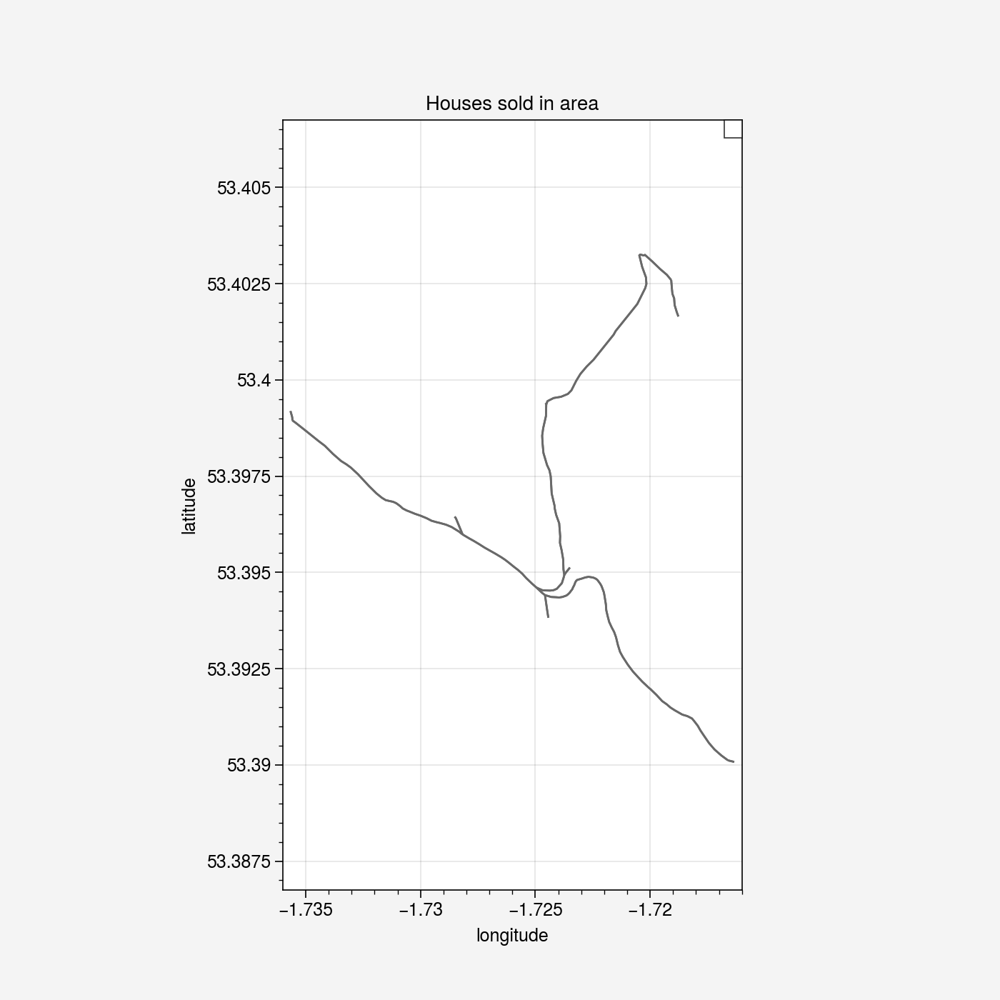

<Figure size 900x900 with 0 Axes>

In [20]:
plot_houses__radius(53.3967492,-1.7259923,0.01,conn)

In [ ]:
def profile_osmdata(latitude,longitude,radius):
  tag="building"
  keys= ['residential','semidetached_house','apartments','house','detached','terrace']
  tags = {"building": 'residential',"building":'semidetached_house',"building":'apartments',"building":'house',"building":'detached',"building":'terrace', "building":True, "landuse":True, }
  pois = ox.geometries_from_bbox(latitude+radius, latitude-radius, longitude+radius, longitude-radius, tags)
  #pois = (pois[pois.building.isin(keys)])
  
  if ("residential" in list(pois['building'])):
    print("There are this many residential buildings in this area:")
    print(len(pois[pois['building']=="residential"]))
    print("Maybe try a larger bounding box")
  print("This is the landuses of this area:")
  display(pois['landuse'].unique())
  if ("farmland" in list(pois['landuse'])):
    print("This area contains a lot of farmland, it is possible there aren't many houses here")

profile_osmdata(53.3967492,-1.7259923,0.01)

Not many houses were sold in this area, this data might not be very accurate

We've found no houses near here, checking osmnx data

###Conclusions

For the granularity of data that we had access to, the model predicts fairly well, being in line with other house price prediction models online.

The OSM data ended up not being the most influential source of data, instead it was the prices data joined with postcode location. This was because the features of the OSM data were already absorbed into the location of each postcode, and as we did not have access to the exact location of each property, we could not use any finer detailing than the postcode.

Indeed the scope of this question itself can only find an expected price for the general area around the point given, as it does not necessarily match to a real property.

To improve this model, one might want to find some data about things more specific to the individual properties. This could be more exact location data, so that the OSM data could be used more. After consulting a lot of listings on estate agents websites, and looking at articles about predictors of property pricing, the more useful data to help differentiate between properties would be information about the property itself. This would be things like garden size, number of bedrooms, number of bathrooms, any additional features or extensions to the property like a pool or a conservatory, and the state of the interior design itself.

This is much more difficult to collect reliable data for though, and sites that use this are typically using a surveyor's prediction of how much the property should be worth, before negotiations are made. This is why for properties that have not been sold recently, other tools will typically show a range of prices.

Indeed, finding data on how many rooms a house has, has been found difficult by the Office of Nationsal Statistics:
https://www.ons.gov.uk/census/censustransformationprogramme/questiondevelopment/housingcommunalestablishmentsandvisitors/estimatingthenumberofroomsandbedroomsinthe2021censusanalternativeapproachusingvaluationofficeagencydata

They say that homeowners often report wrong, and exact classifications are often difficult to achieve.

This project likely looks slightly different to others, not all of the plots evaluated have been shown, just a few key ones. The approach taken was one of emphasis on understanding the data and what any data looked at means, and this meant that a lot of time was spent getting familiar with the data itself, even including understanding roughly what different coordinate values mean.

As an exercise on an approach to data science, this has been incredibly helpful. I would propose that part of the assess section of the fynesse framework should contain these parts:

Inspect: Read about where the data has come from, look at each feature and find out what it is supposed to record and where it has come from. Look at the individual files by eye to gain familiarity of what the data looks like, and help spot any anomalies early.

Familiarise: Look at different features of the data you have one by one, and then in pairs. 

Contextualise: For every part of the data you look at, try to gain some contextual understanding of what it is, where it comes from, and how it interacts with other parts, as well as if it is connected to something not within the realms of the dataset. Whilst this usually takes the role of communicating with an expert when they look at our work, data scientists still have a responsability to try to understand the meaning of the data they work with. This can be done by doing base initial reading on the subjet online, or in books, but making sure to question each thing you see carefully.

Questioning: For every correlation you see, question it. Why might it have happened, does this repeat across the entire data set? Are there smaller parts that can be looked at that show different correlations?

####One apology
Please accept my apologies for the warnings that appear inbetween graphs, despite trying my best, they are due to a deprecation in one of the libraries used. If I had more time I would have spent more time trying to remove this, but I feel it does not impact the content of the notebook too much.

### Notes on reusability
The code written for this project aims to be reusable where possible.

The visualisations can be repurposed for looking at other features easily, and some are interactive.
The database setup can easily be switched for a different link if you wish to try some of the visualisations yourself.
